### Breast cancer wisconsin (diagnostic) dataset

**1. Description about the Breast cancer wisconsin (diagnostic) dataset can be found in Section 7.1.7 of the following web page:**

https://scikit-learn.org/stable/datasets/toy dataset.html#breast-cancer-wisconsin-diagnostic-dataset

There are two classes in the dataset:
> - malignant (212 instances, class value 0) and <br>
> - benign (357 instances, class value 1). 

Follow the example code given on the web page:https://scikit-learn.org/stable/modules/generated/sklearn.datasets.load breast cancer.html#sklearn.datasets. 

- [x] Load breast cancer to read in the dataset and separate it into a feature matrix X and a class vector y. Your feature matrix should have 569 (rows) × 30 (columns) and your class vector should have 569 elements.


In [1]:
import warnings
warnings.simplefilter('ignore')

from sklearn.datasets import load_breast_cancer
breast_cancer_data = load_breast_cancer(as_frame=True)

In [2]:
print(breast_cancer_data.DESCR) # This gives the description of the dataset

.. _breast_cancer_dataset:

Breast cancer wisconsin (diagnostic) dataset
--------------------------------------------

**Data Set Characteristics:**

    :Number of Instances: 569

    :Number of Attributes: 30 numeric, predictive attributes and the class

    :Attribute Information:
        - radius (mean of distances from center to points on the perimeter)
        - texture (standard deviation of gray-scale values)
        - perimeter
        - area
        - smoothness (local variation in radius lengths)
        - compactness (perimeter^2 / area - 1.0)
        - concavity (severity of concave portions of the contour)
        - concave points (number of concave portions of the contour)
        - symmetry
        - fractal dimension ("coastline approximation" - 1)

        The mean, standard error, and "worst" or largest (mean of the three
        worst/largest values) of these features were computed for each image,
        resulting in 30 features.  For instance, field 0 is Mean Radi

In [3]:
X=breast_cancer_data.data
X.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [4]:
y=breast_cancer_data.target
y.head()

0    0
1    0
2    0
3    0
4    0
Name: target, dtype: int64

**2. Investigate whether some features can be dropped through some suitable visualisation of the data.**

For instance, if two features have a linear relationship, then it will be sufficient to keep only one of these features. 

- [ ] If you use a different colour in the visualisation to show data points coming from each class, you will find that majorities of the points from the two classes are well separated. So we can assess that the classification task later on should not be too difficult.

- [ ] Determine from your visualisation what features can be dropped and write Python code to drop them from your feature matrix X.

- [ ] Split X and y into a training set and a test set using the split ratio 85/15 and random state=123.

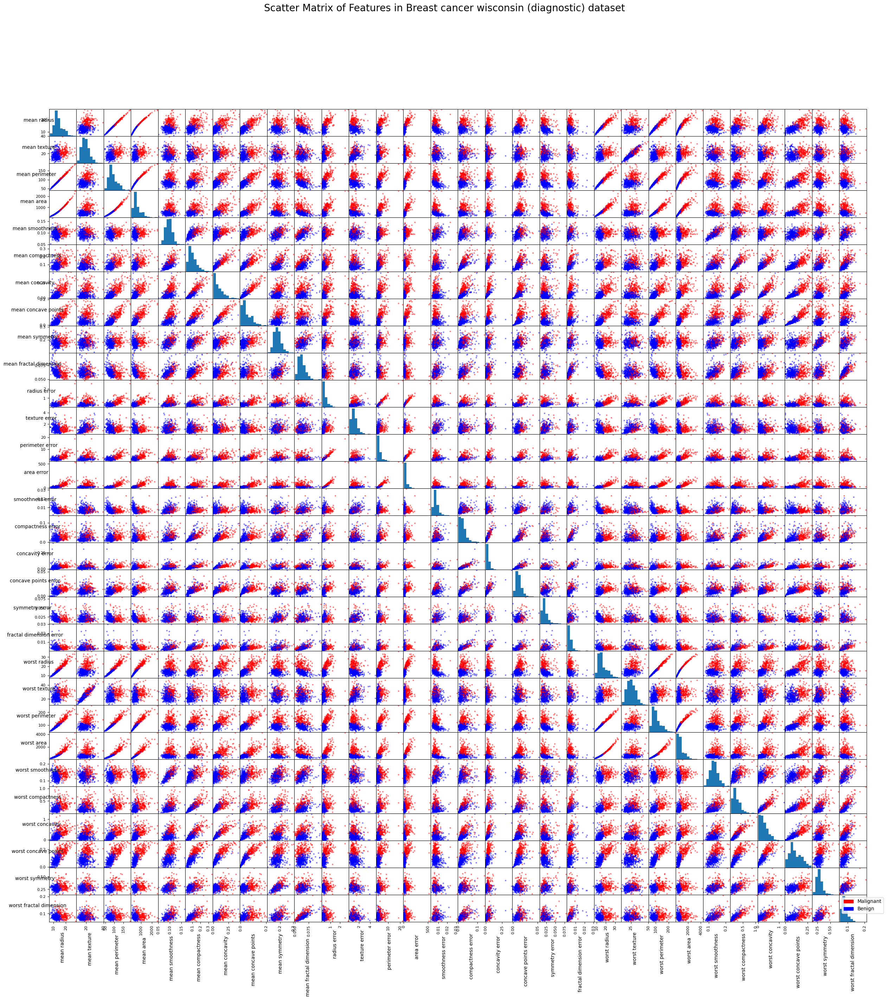

In [5]:
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Define colors for malignant and benign data points
# Red - Malignant
# Blue - Benign
colors = ['red' if label == 0 else 'blue' for label in y]

scatter_matrix_plot = scatter_matrix(X, figsize=(30, 30), diagonal='hist', color=colors)

# Create empty scatter plots with the same colors as our actual data points
red_patch = mpatches.Patch(color='red', label='Malignant')
blue_patch = mpatches.Patch(color='blue', label='Benign')

for i, axs in enumerate(scatter_matrix_plot):
    for j, ax in enumerate(axs):
        if i == len(scatter_matrix_plot) - 1:
            ax.set_xlabel(X.columns[j], rotation=90)
        if j == 0:
            ax.set_ylabel(X.columns[i], rotation=0)          

for ax in scatter_matrix_plot.ravel():
    ax.tick_params(axis='x', labelrotation = 90)
    ax.tick_params(axis='y', labelrotation = 0)
    
# Add legend
plt.legend(handles=[red_patch, blue_patch], loc='upper left')

plt.suptitle('Scatter Matrix of Features in Breast cancer wisconsin (diagnostic) dataset', fontsize=20)      
plt.show()


The above scatterplot illustrates the relationship between each feature in the dataset. The points in `red` represent the `malignant` data instances, while the `blue` points represent `benign` data instances. There are some features that appear to be correlated with each other. To further investigate the collinearity among features, we can plot a correlation matrix heatmap. Based on the results, we can then remove features that are strongly correlated with each other.

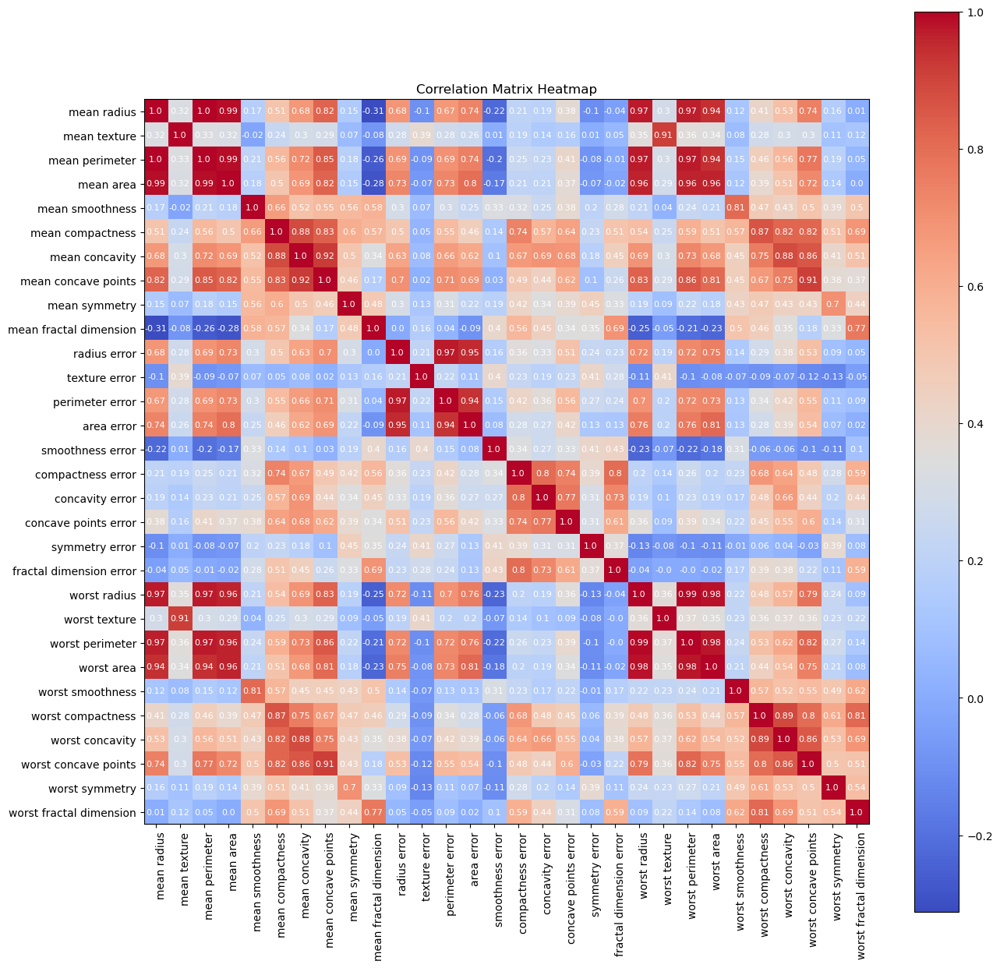

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# calculate the correlation matrix
corr_matrix = X.corr()

# create the heatmap plot
fig, ax = plt.subplots(figsize=(15,15))
im = ax.imshow(corr_matrix, cmap='coolwarm')

# add a colorbar
cbar = ax.figure.colorbar(im, ax=ax)

# set the axis labels
ax.set_xticks(np.arange(len(corr_matrix.columns)))
ax.set_yticks(np.arange(len(corr_matrix.columns)))
ax.set_xticklabels(corr_matrix.columns, fontsize=10)
ax.set_yticklabels(corr_matrix.columns, fontsize=10)

# rotate the tick labels and set their alignment
plt.setp(ax.get_xticklabels(), rotation=90, ha="right", rotation_mode="anchor")

# add the correlation coefficients in each cell of the heatmap
for i in range(len(corr_matrix.columns)):
    for j in range(len(corr_matrix.columns)):
        text = ax.text(j, i, round(corr_matrix.iloc[i, j], 2), ha="center", va="center", color="w", fontsize=8)

# set the title
ax.set_title("Correlation Matrix Heatmap")

# show the plot
plt.show()

From the analysis of the scatter matrix plot and correlation matrix, it is evident that some features exhibit high correlation with other features. In order to avoid redundancy and improve the performance of the model, we will drop the highly correlated features and retain only those that are independent. The following features are highly correlated:

1. MEAN RADIUS:
   - mean perimeter
   - mean area
   - worst radius
   - worst perimeter
   - worst area

2. MEAN TEXTURE:
   - worst texture

3. MEAN COMPACTNESS:
   - worst compactness                   
   - mean concavity
                                       
4. MEAN SMOOTHNESS

5. MEAN CONCAVE POINTS:
   - worst concae points
   - mean concavity
                    
6. MEAN SYMMETRY

7. MEAN FRACTAL DIMENSION

8. RADIUS ERROR:
   - perimeter error
   - area error
             
9. TEXTURE ERROR

10. SMOOTHNESS ERROR

11. COMPACTNESS ERROR

12. CONCAVITY ERROR

13. CONCAVE POINTS ERROR

14. SYMMETRY ERROR

15. FRACTAL DIMENSION ERROR

Therefore, we will remove the correlated columns and only retain the independent features for the model.

In [7]:
X = X[['mean radius', 'mean texture', 'mean compactness', 'mean smoothness', 'mean concave points', 'mean symmetry', 'mean fractal dimension',
                              'radius error', 'texture error', 'smoothness error', 'concavity error', 'concavity error', 'concave points error', 'symmetry error', 'fractal dimension error'
                             ]]

Performing stratified sampling to split the data into training and test sets, ensuring that the proportion of target labels is maintained in both sets. This will ensure that our training and test sets are representative of the entire dataset.

In [8]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=123, stratify=y)


**3. Investigate a few decision tree classifiers with different hyperparameter values as follows:**

- [ ] Train a decision tree classifier using the default values for all the hyperparameters.

- [ ] Use the trained classifier to perform predictions on the training set and the test set. Compare the accuracy scores for the two sets.

- [ ] Do you think this classifier has an overfitting issue? Why?

In [9]:
from sklearn.tree import DecisionTreeClassifier
tree_clf_1 = DecisionTreeClassifier(random_state=8) 
tree_clf_1.fit(X_train, y_train)

DecisionTreeClassifier(random_state=8)

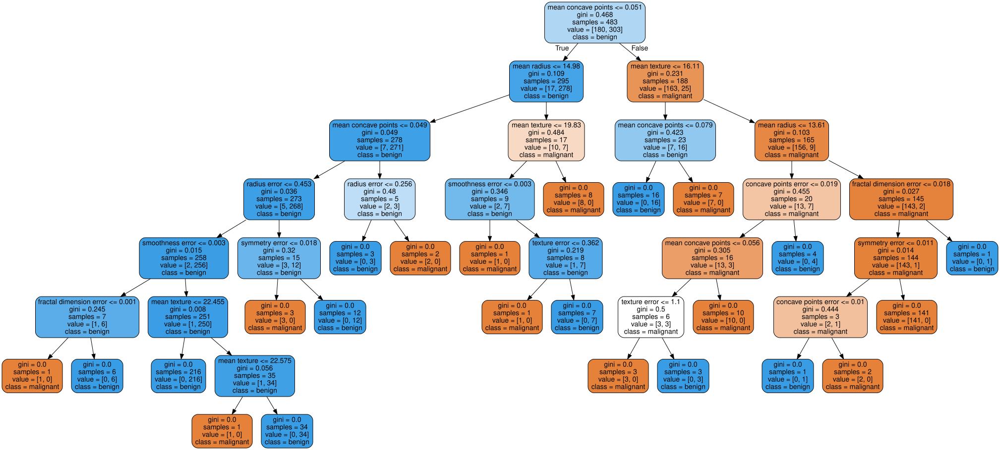

In [10]:
from sklearn.tree import export_graphviz

export_graphviz(
    tree_clf_1,
    out_file='tree_clf_1.dot',
    feature_names=X.columns,
    class_names=breast_cancer_data.target_names,
    filled=True,
    rounded=True,
    
)

from graphviz import Source

Source.from_file('tree_clf_1.dot')

The decision tree's default configuration, with no regularization or hyperparameters, has a depth of 7 despite the dataset's small size. This deep tree structure could potentially cause overfitting, which we will confirm in the following analysis.

In [11]:
y_train_pred = tree_clf_1.predict(X_train)
y_test_pred = tree_clf_1.predict(X_test)

print(f'Accuracy for Training Data (Default): {tree_clf_1.score(X_train, y_train)}')
print(f'Accuracy for Test Data (Default): {round(tree_clf_1.score(X_test, y_test), 3)}')

Accuracy for Training Data (Default): 1.0
Accuracy for Test Data (Default): 0.919


The model has shown an accuracy of 100% on the training dataset, but only 91.9% on the test dataset, indicating that the model is overfitting. 

To visualize the difference between the model's predictions on the training and test datasets, I will use 'mean radius' and 'mean texture' as the two features.

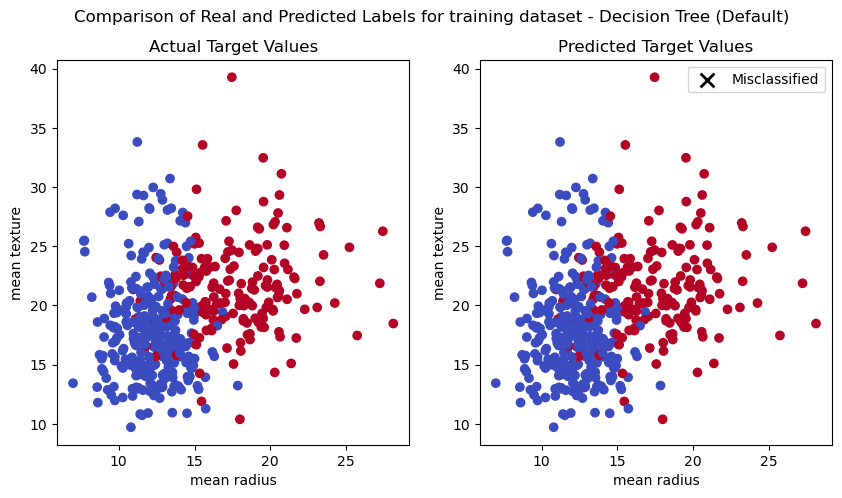

In [12]:
import numpy as np
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
fig.suptitle("Comparison of Real and Predicted Labels for training dataset - Decision Tree (Default)")

# Plot for actual target values
actual_plot = axes[0].scatter(X_train['mean radius'], X_train['mean texture'], c=y_train, cmap='coolwarm_r')
axes[0].set_xlabel('mean radius')
axes[0].set_ylabel('mean texture')
axes[0].set_title('Actual Target Values')

# Plot for predicted target values
predicted_plot = axes[1].scatter(X_train['mean radius'], X_train['mean texture'], c=y_train_pred, cmap='coolwarm_r')
axes[1].set_xlabel('mean radius')
axes[1].set_ylabel('mean texture')
axes[1].set_title('Predicted Target Values')

# Highlight mispredicted data points with a different color
misclassified = np.where(y_train != y_train_pred)[0]
axes[1].scatter(X_train.iloc[misclassified]['mean radius'], X_train.iloc[misclassified]['mean texture'], 
                marker='x', s=100, linewidth=2, c='black', label='Misclassified')

plt.legend()
plt.show()

The plot indicates that the model has demonstrated overfitting, as all predictions in the training dataset were correct.

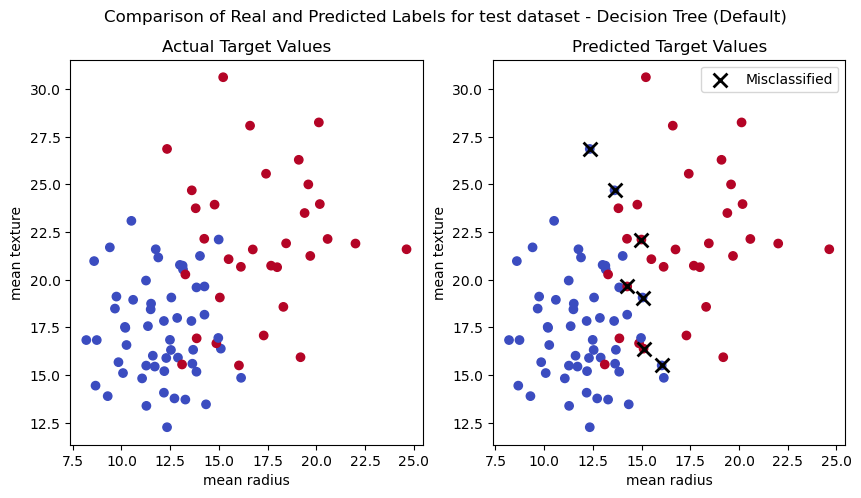

In [13]:
import numpy as np
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

fig.suptitle("Comparison of Real and Predicted Labels for test dataset - Decision Tree (Default)")

# Plot for actual target values
axes[0].scatter(X_test['mean radius'], X_test['mean texture'], c=y_test, cmap='coolwarm_r')
axes[0].set_xlabel('mean radius')
axes[0].set_ylabel('mean texture')
axes[0].set_title('Actual Target Values')

# Plot for predicted target values

axes[1].scatter(X_test['mean radius'], X_test['mean texture'], c=y_test_pred, cmap='coolwarm_r')
axes[1].set_xlabel('mean radius')
axes[1].set_ylabel('mean texture')
axes[1].set_title('Predicted Target Values')

# Highlight mispredicted data points with a different color
misclassified = np.where(y_test != y_test_pred)[0]
axes[1].scatter(X_test.iloc[misclassified]['mean radius'], X_test.iloc[misclassified]['mean texture'], 
                marker='x', s=100, linewidth=2, c='black', label='Misclassified')

plt.legend()
plt.show()


On the right plot, data points with incorrect predictions are visible, including both false positives and false negatives.

- [ ] Follow the example code for Chapter 6 from the GitHub page for the textbook to display the decision tree built from the training process (like the one shown in Figure 6.1 of the textbook for the iris dataset). You will need to restrict the depth of the tree for the display (e.g., by setting max depth=3); otherwise, the diagram will be too large. Study the diagram to see if it can help you to confirm whether the classifier has an overfitting issue.


- [ ] Construct a second decision tree classifier by setting the hyperparameter max depth=3. Repeat all the steps above for this new classifier. Compare the accuracy scores for the training set and test sets with those from the previous classifier (note that your classification results may differ for different runs of the code). 

In [14]:
tree_clf_2 = DecisionTreeClassifier(random_state=8, max_depth=3) 
tree_clf_2.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=3, random_state=8)

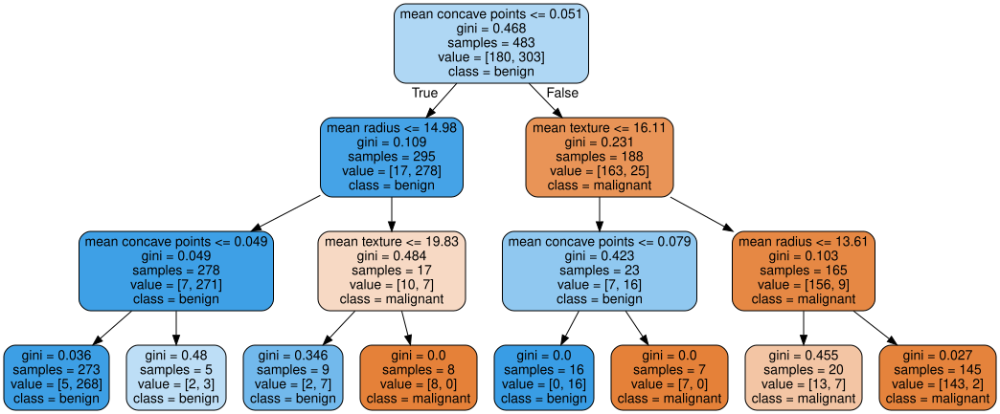

In [15]:
from sklearn.tree import export_graphviz

export_graphviz(
    tree_clf_2,
    out_file='tree_clf_2.dot',
    feature_names=X.columns,
    class_names=breast_cancer_data.target_names,
    filled=True,
    rounded=True
)

from graphviz import Source

Source.from_file('tree_clf_2.dot')

As shown in the diagram above, we constructed a decision tree with a depth of 3. The root node of the tree employs `mean concave points` to split the data, resulting in a left node at depth 1 that uses `mean radius`, and a right node that uses `mean texture` to make predictions. 

In [16]:
y_train_pred = tree_clf_2.predict(X_train)
y_test_pred = tree_clf_2.predict(X_test)

print(f'Accuracy for training data (Max depth=3) : { round(tree_clf_2.score(X_train, y_train), 3) }')
print(f'Accuracy for test data (Max depth=3) : { round(tree_clf_2.score(X_test, y_test), 3) }')

Accuracy for training data (Max depth=3) : 0.963
Accuracy for test data (Max depth=3) : 0.907


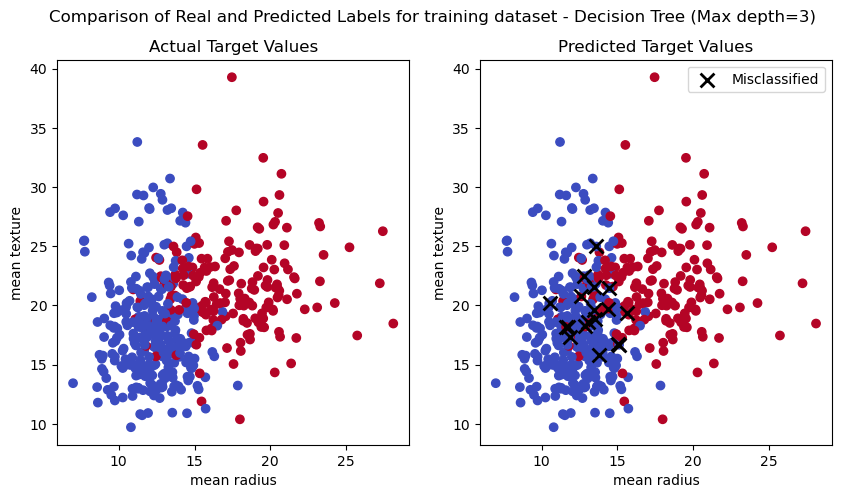

In [17]:
import numpy as np
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
fig.suptitle("Comparison of Real and Predicted Labels for training dataset - Decision Tree (Max depth=3)")

# Plot for actual target values
actual_plot = axes[0].scatter(X_train['mean radius'], X_train['mean texture'], c=y_train, cmap='coolwarm_r')
axes[0].set_xlabel('mean radius')
axes[0].set_ylabel('mean texture')
axes[0].set_title('Actual Target Values')

# Plot for predicted target values
predicted_plot = axes[1].scatter(X_train['mean radius'], X_train['mean texture'], c=y_train_pred, cmap='coolwarm_r')
axes[1].set_xlabel('mean radius')
axes[1].set_ylabel('mean texture')
axes[1].set_title('Predicted Target Values')

# Highlight mispredicted data points with a different color
misclassified = np.where(y_train != y_train_pred)[0]
axes[1].scatter(X_train.iloc[misclassified]['mean radius'], X_train.iloc[misclassified]['mean texture'], 
                marker='x', s=100, linewidth=2, c='black', label='Misclassified')

plt.legend()
plt.show()

Upon adding a `max depth` of 3 to the decision tree, we observe that the model no longer overfits to the training data, while maintaining respectable levels of accuracy as follows:
- Accuracy for the training data (Max depth=3): 0.963
- Accuracy for the test data (Max depth=3): 0.907

Therefore, we can conclude that the updated model has better generalization performance compared to the default tree.

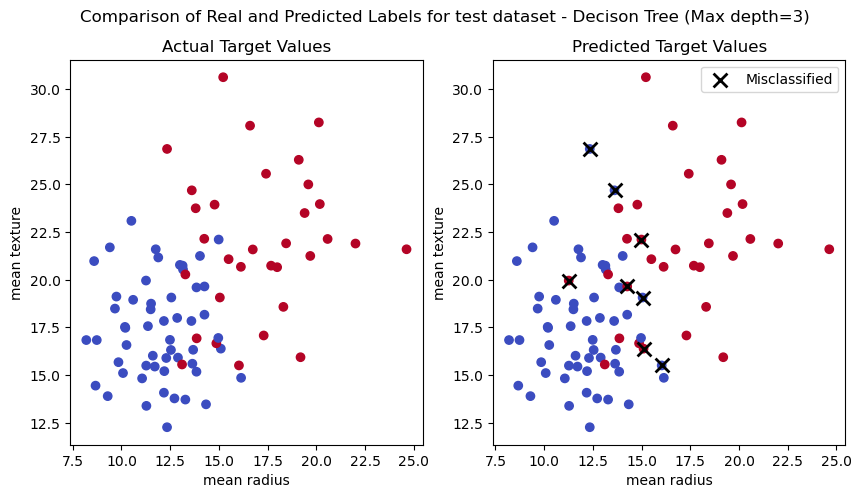

In [18]:
import numpy as np
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

fig.suptitle("Comparison of Real and Predicted Labels for test dataset - Decison Tree (Max depth=3)")

# Plot for actual target values
axes[0].scatter(X_test['mean radius'], X_test['mean texture'], c=y_test, cmap='coolwarm_r')
axes[0].set_xlabel('mean radius')
axes[0].set_ylabel('mean texture')
axes[0].set_title('Actual Target Values')

# Plot for predicted target values

axes[1].scatter(X_test['mean radius'], X_test['mean texture'], c=y_test_pred, cmap='coolwarm_r')
axes[1].set_xlabel('mean radius')
axes[1].set_ylabel('mean texture')
axes[1].set_title('Predicted Target Values')

# Highlight mispredicted data points with a different color
misclassified = np.where(y_test != y_test_pred)[0]
axes[1].scatter(X_test.iloc[misclassified]['mean radius'], X_test.iloc[misclassified]['mean texture'], 
                marker='x', s=100, linewidth=2, c='black', label='Misclassified')

plt.legend()
plt.show()


Although the test dataset still contains false positives and false negatives, the overall accuracy remains satisfactory given that the model has not overfitted to the training data.

- [ ] Construct a third decision tree classifier by setting the hyperparameter min samples split=5. Repeat all the steps above for this new classifier. Compare the accuracy scores for the training set and test set with those from all the previous classifiers

In [19]:
tree_clf_3 = DecisionTreeClassifier(random_state=8, min_samples_split=5)
tree_clf_3.fit(X_train, y_train)

# QUESTION: ARE WE SUPPOSED TO USE MAX DEPTH = 3 HERE OR LEAVE ALL OTHER PARAMETERS TO DEFAULT

DecisionTreeClassifier(min_samples_split=5, random_state=8)

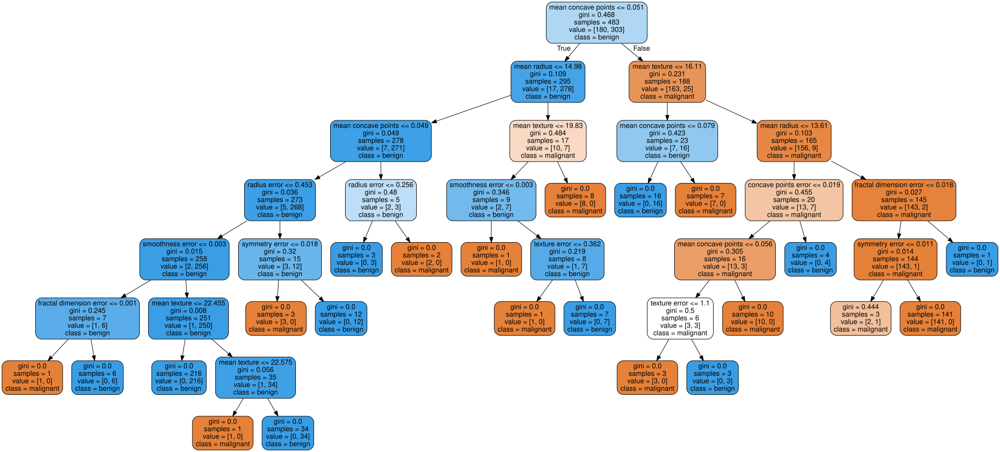

In [20]:
from sklearn.tree import export_graphviz

export_graphviz(
    tree_clf_3,
    out_file='tree_clf_3.dot',
    feature_names=X.columns,
    class_names=breast_cancer_data.target_names,
    filled=True,
    rounded=True
)

from graphviz import Source

Source.from_file('tree_clf_3.dot')

In [22]:
tree_clf_3.score(X_train, y_train)

0.9979296066252588

In [23]:
tree_clf_3.score(X_test, y_test)

0.9186046511627907

- [ ] Construct a fourth decision tree classifier by setting the hyperparameter min samples leaf=5. Repeat all the steps above for this new classifier. Compare the accuracy scores for the training set and test set with those from all the previous classifiers.

In [24]:
tree_clf_4 = DecisionTreeClassifier(random_state=8, min_samples_leaf=5)
tree_clf_4.fit(X_train, y_train)

# QUESTION: LEAVE ALL PARAMETERS AS IT IS? OR GO WITH DEFAULT

DecisionTreeClassifier(min_samples_leaf=5, random_state=8)

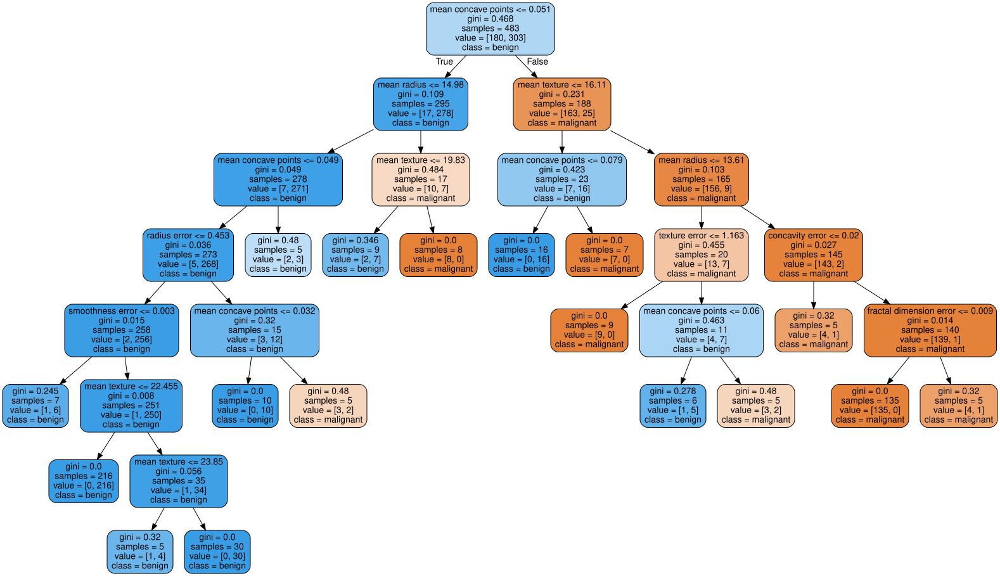

In [25]:
export_graphviz(
    tree_clf_4,
    out_file='tree_clf_4.dot',
    feature_names=X.columns,
    class_names=breast_cancer_data.target_names,
    filled=True,
    rounded=True
)

from graphviz import Source

Source.from_file('tree_clf_4.dot')

In [26]:
tree_clf_4.score(X_train, y_train)

0.9730848861283644

In [27]:
tree_clf_4.score(X_test, y_test)

0.9069767441860465

- [ ] Use a 3-fold cross-validation and grid-search to find the best combination of these hyperparameters (max depth, min samples split and min samples leaf). Report the results of the cross-validation. Compare the values of the best hyperparameters from the cross-validation with the ones you used before and comment on them.

In [28]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier

# Create a decision tree classifier
tree_clf = DecisionTreeClassifier(random_state=8)

# Define the hyperparameters to be tuned and their possible values
parameters = {'max_depth': [3, 4, 5, 6, 7, 8],
              'min_samples_split': [2, 3, 4, 5, 6, 7, 8, 9, 10],
              'min_samples_leaf': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]}

# Create a GridSearchCV object with 3-fold cross-validation
clf = GridSearchCV(tree_clf, parameters, cv=3)

# Fit the GridSearchCV object to the training data
clf.fit(X_train, y_train)

# Print the best hyperparameters and their corresponding score
print('Best hyperparameters:', clf.best_params_)
print('Best score:', clf.best_score_)


Best hyperparameters: {'max_depth': 3, 'min_samples_leaf': 4, 'min_samples_split': 2}
Best score: 0.9316770186335402


In [29]:
tree_clf_opt = DecisionTreeClassifier(random_state=8, max_depth=3, min_samples_leaf=4, min_samples_split=2)

In [30]:
tree_clf_opt.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=3, min_samples_leaf=4, random_state=8)

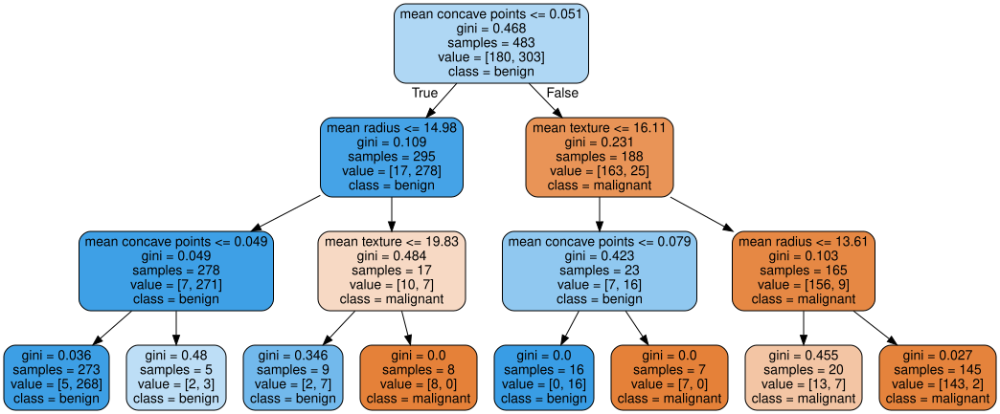

In [31]:
export_graphviz(
    tree_clf_opt,
    out_file='tree_clf_opt.dot',
    feature_names=X.columns,
    class_names=breast_cancer_data.target_names,
    filled=True,
    rounded=True
)


Source.from_file('tree_clf_opt.dot')

In [32]:
tree_clf_opt.score(X_train, y_train)

0.9627329192546584

In [33]:
tree_clf_opt.score(X_test, y_test)

0.9069767441860465

- [ ] Use the best hyperparameters from the 3-fold cross-validation and report the training and test set results. Comments about the results and compare them with the previous classifiers. Think about what the dataset is about when commenting on the results. For the comparison, you can display the confusion matrices and performance metrics such as precision and recall for training and test sets.

When commenting on the results, we should consider the nature of the dataset. In this case, the dataset is related to breast cancer diagnosis, where the goal is to classify a tumor as either malignant or benign based on various features. Therefore, we should aim for high accuracy in predicting the class of the tumor, while minimizing false positives and false negatives. We can compare the results with previous classifiers to see if the performance has improved with the best hyperparameters found from the cross-validation.






In [34]:
from sklearn.metrics import confusion_matrix

train_conf_matrix = confusion_matrix(y_train, y_train_pred)
test_conf_matrix = confusion_matrix(y_test, y_test_pred)


In [35]:
train_conf_matrix

array([[171,   9],
       [  9, 294]])

In [36]:
test_conf_matrix

array([[28,  4],
       [ 4, 50]])

In [37]:
y_test_pred = tree_clf_opt.predict(X_test)

In [38]:
from sklearn.metrics import classification_report


report = classification_report(y_test, y_test_pred)
print(report)

# Probably compute this for all the trees above

              precision    recall  f1-score   support

           0       0.88      0.88      0.88        32
           1       0.93      0.93      0.93        54

    accuracy                           0.91        86
   macro avg       0.90      0.90      0.90        86
weighted avg       0.91      0.91      0.91        86



### Concrete Slump Test (20 marks)

The Concrete Slump Test dataset
https://archive.ics.uci.edu/ml/datasets/Concrete+Slump+Test
is a small dataset suitable for regression.

For any new test instance, our aim is to use our trained model
to predict its 28-day Compressive Strength (Mpa) value. The slump test.data dataset can be downloaded
directly from the link below:

https://archive.ics.uci.edu/ml/machine-learning-databases/concrete/slump/

Although the name of the file ends with .data, it is actually a csv file.

- [ ] NOTE: Save the downloaded file (slump test.data) to the same directory with your Jupyter Notebook file. Do not rename or modify the file in any way.

- [ ] Firstly, inspect the data and perform data cleaning if needed. 

- [ ] As described on the web page above. there are 7 input variables (i.e., feature columns) and 3 output variables. Our interest is the 28-day Compressive Strength output, so the other two output variables should be dropped. 

- [ ] Perform some basic visualisation and determine whether any additional features should be removed also. You should write a Python function for this data cleaning step.

In [39]:
import pandas as pd

slump_data = pd.read_csv('slump_test.data')
slump_data

,No,Cement,Slag,Fly ash,Water,SP,Coarse Aggr.,Fine Aggr.,SLUMP(cm),FLOW(cm),Compressive Strength (28-day)(Mpa)
0,1,273.0,82.0,105.0,210.0,9.0,904.0,680.0,23.0,62.0,34.99
1,2,163.0,149.0,191.0,180.0,12.0,843.0,746.0,0.0,20.0,41.14
2,3,162.0,148.0,191.0,179.0,16.0,840.0,743.0,1.0,20.0,41.81
3,4,162.0,148.0,190.0,179.0,19.0,838.0,741.0,3.0,21.5,42.08
4,5,154.0,112.0,144.0,220.0,10.0,923.0,658.0,20.0,64.0,26.82
...,...,...,...,...,...,...,...,...,...,...,...
98,99,248.3,101.0,239.1,168.9,7.7,954.2,640.6,0.0,20.0,49.97
99,100,248.0,101.0,239.9,169.1,7.7,949.9,644.1,2.0,20.0,50.23
100,101,258.8,88.0,239.6,175.3,7.6,938.9,646.0,0.0,20.0,50.50
101,102,297.1,40.9,239.9,194.0,7.5,908.9,651.8,27.5,67.0,49.17


In [40]:
X = slump_data[['Cement', 'Slag', 'Fly ash', 'Water', 'SP', 'Coarse Aggr.', 'Fine Aggr.']]
X

,Cement,Slag,Fly ash,Water,SP,Coarse Aggr.,Fine Aggr.
0,273.0,82.0,105.0,210.0,9.0,904.0,680.0
1,163.0,149.0,191.0,180.0,12.0,843.0,746.0
2,162.0,148.0,191.0,179.0,16.0,840.0,743.0
3,162.0,148.0,190.0,179.0,19.0,838.0,741.0
4,154.0,112.0,144.0,220.0,10.0,923.0,658.0
...,...,...,...,...,...,...,...
98,248.3,101.0,239.1,168.9,7.7,954.2,640.6
99,248.0,101.0,239.9,169.1,7.7,949.9,644.1
100,258.8,88.0,239.6,175.3,7.6,938.9,646.0
101,297.1,40.9,239.9,194.0,7.5,908.9,651.8


In [41]:
y = slump_data['Compressive Strength (28-day)(Mpa)']
y

0      34.99
1      41.14
2      41.81
3      42.08
4      26.82
       ...  
98     49.97
99     50.23
100    50.50
101    49.17
102    48.77
Name: Compressive Strength (28-day)(Mpa), Length: 103, dtype: float64

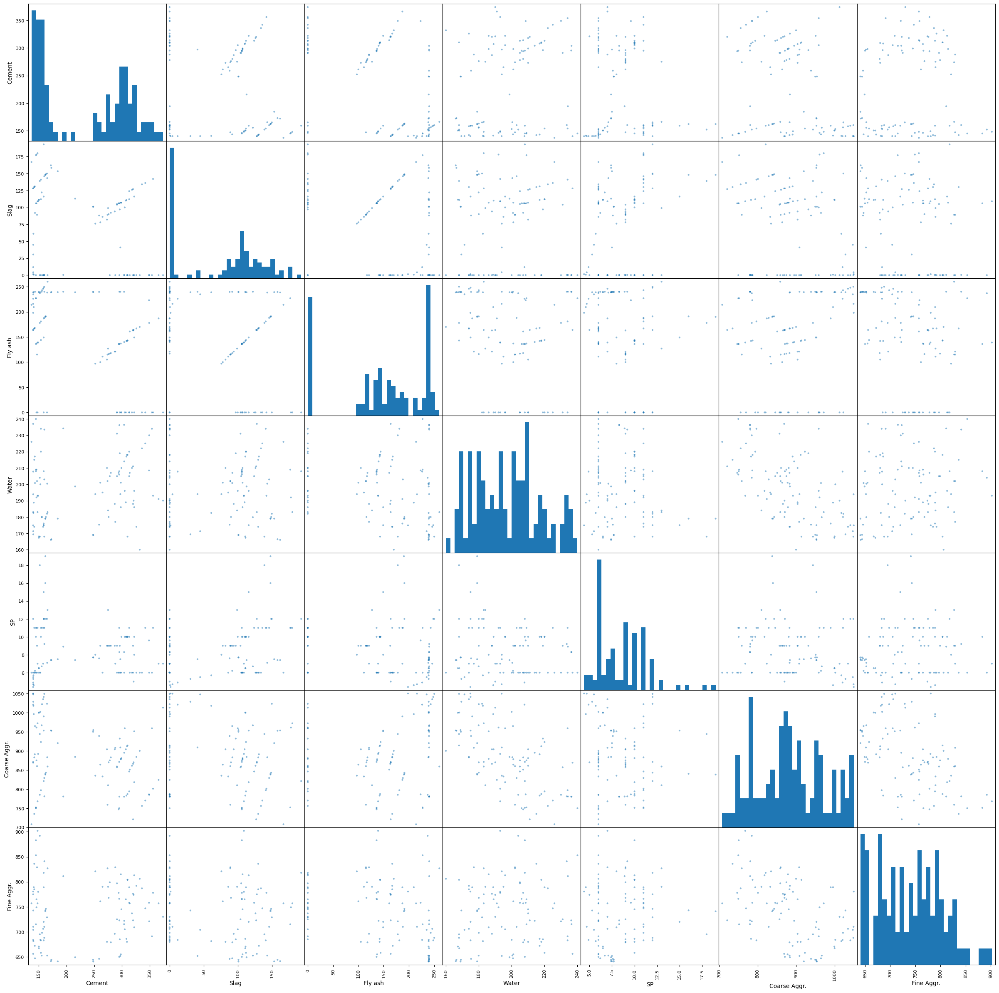

In [42]:
scatter_matrix_plot = scatter_matrix(X, figsize=(30, 30), diagonal='hist', hist_kwds={'bins': 30})

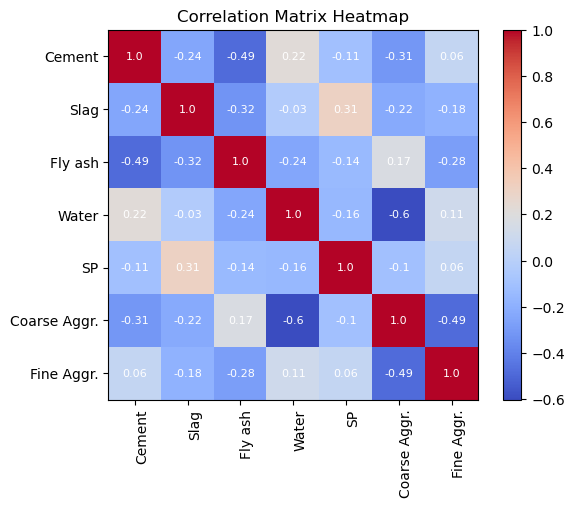

In [43]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# create a sample dataframe


# calculate the correlation matrix
corr_matrix = X.corr()

# create the heatmap plot

fig, ax = plt.subplots()
im = ax.imshow(corr_matrix, cmap='coolwarm')

# add a colorbar
cbar = ax.figure.colorbar(im, ax=ax)

# set the axis labels
ax.set_xticks(np.arange(len(corr_matrix.columns)))
ax.set_yticks(np.arange(len(corr_matrix.columns)))
ax.set_xticklabels(corr_matrix.columns)
ax.set_yticklabels(corr_matrix.columns)

# rotate the tick labels and set their alignment
plt.setp(ax.get_xticklabels(), rotation=90, ha="right", rotation_mode="anchor")

# add the correlation coefficients in each cell of the heatmap
for i in range(len(corr_matrix.columns)):
    for j in range(len(corr_matrix.columns)):
        text = ax.text(j, i, round(corr_matrix.iloc[i, j], 2), ha="center", va="center", color="w", fontsize=8)

# set the title
ax.set_title("Correlation Matrix Heatmap")

# show the plot
plt.show()


The above correlation matrix heatmap and scatterplot shows there is not much correlation among the features

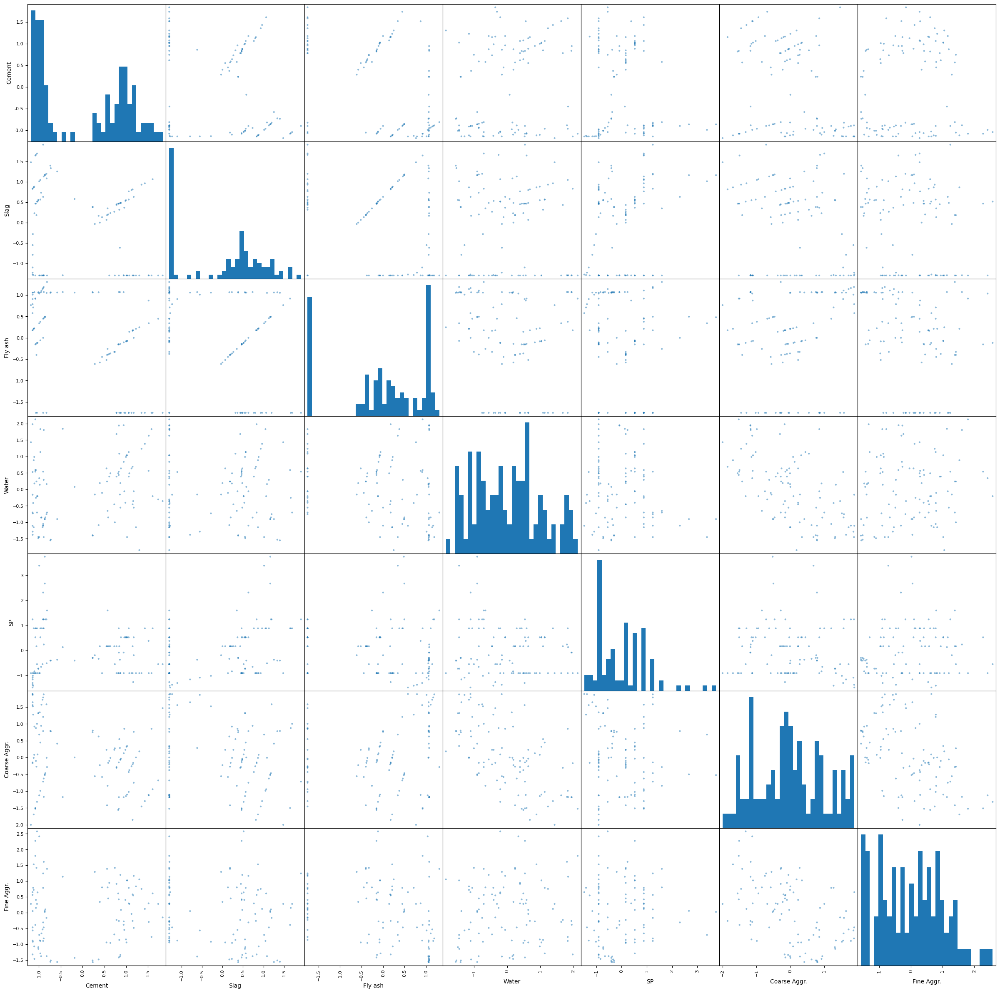

In [44]:
from sklearn.preprocessing import StandardScaler

std_scaler = StandardScaler()
X_scaled = std_scaler.fit_transform(X)

X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns)

scatter_matrix(X_scaled_df, figsize=(30, 30), diagonal='hist', hist_kwds={'bins': 30})
plt.show()

- [ ] Perform a 80/20 random split on the dataset to form a training set and a test set.

- [ ] For your Voting regressor, use the following as the 3 base estimators with default hyperparameters:
> (i) a linear SVM regressor, <br>
> (ii) a linear regressor (using the LinearRegression class), and <br>
> (iii) a Stochastic Gradient Descent regressor.  

In [45]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)


In [46]:
from sklearn.svm import LinearSVR
from sklearn.linear_model import LinearRegression, SGDRegressor

estimators = [('svm', LinearSVR()), ('lr', LinearRegression()), ('sgd', SGDRegressor())]


In [47]:
from sklearn.ensemble import VotingRegressor

voting_regressor = VotingRegressor(estimators)


In [48]:
voting_regressor

VotingRegressor(estimators=[('svm', LinearSVR()), ('lr', LinearRegression()),
                            ('sgd', SGDRegressor())])

In [49]:
y_train

53     38.59
22     18.52
68     46.36
44     30.97
98     49.97
       ...  
71     28.16
14     32.44
92     44.48
51     32.04
102    48.77
Name: Compressive Strength (28-day)(Mpa), Length: 82, dtype: float64

In [50]:
voting_regressor.fit(X_train, y_train)

VotingRegressor(estimators=[('svm', LinearSVR()), ('lr', LinearRegression()),
                            ('sgd', SGDRegressor())])

 - [ ]  Train the base estimators and the Voting regressor on the training set and compare their predicted 28-day Compressive Strength values for the test set.
 
 - [ ] Report their RMSEs and illustrate the predicted values versus the ground truth values of all the test instances.

In [51]:
X_test_df_cement = pd.DataFrame(X_test, columns=X.columns)['Cement']
X_test_df_cement

0     1.160681
1    -0.814007
2     0.880403
3     0.727524
4    -0.890447
5    -1.081545
6    -0.949050
7     1.122462
8    -1.081545
9     0.549165
10    1.020542
11    1.517399
12    0.833265
13   -1.138875
14   -0.903186
15   -0.966886
16   -1.131231
17    0.561905
18   -1.119765
19    0.995062
20    0.368258
Name: Cement, dtype: float64

svm : [43.02731142 38.45213503 27.77959048 39.05767197 33.38467304 36.21858951
 36.79293193 29.94279253 26.83147446 32.95362877 43.24655913 42.29024307
 40.944665   32.4525023  30.79532666 24.45938915 27.57567288 37.20597957
 28.64797891 40.80572708 46.51864001]
svm RMSE : 2.5200128885230026


lr : [45.28318    42.19739366 28.90788383 40.28253565 35.27019048 38.321975
 37.36774135 30.4442342  29.41854266 34.58007167 45.49043957 45.56214732
 44.53479545 33.47928465 33.34402833 26.27360191 29.27987186 39.41352998
 30.78483751 42.92424721 47.47164239]
lr RMSE : 2.068522874433819


sgd : [45.05509393 42.10639634 29.04634627 40.14358184 35.08740609 38.06919767
 37.42478818 30.47114258 29.42815175 34.53752101 45.40379744 45.36096406
 44.77745324 33.63608017 33.35377134 26.22290793 29.64251686 39.33862794
 30.61640802 42.76043747 47.48285638]
sgd RMSE : 2.0585956060008055


Voting Regressor : [44.45519512 40.91864168 28.57794019 39.82792982 34.58075653 37.53658739
 37.19515382 30.28605644 28.

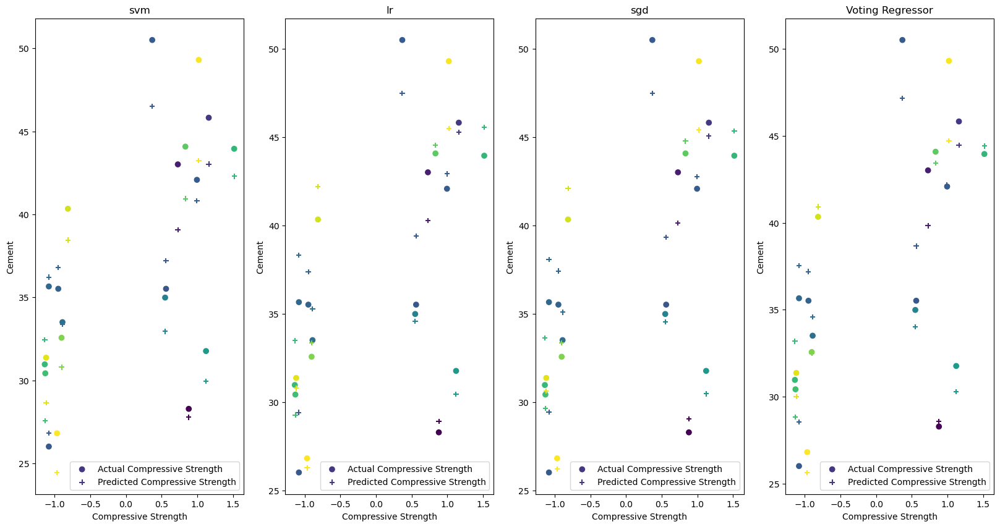

In [52]:
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt




fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(20, 10))

axs = axs.flatten()

colors = np.random.rand(len(y_test))


for idx, (name, clf) in enumerate(voting_regressor.named_estimators_.items()):
    
     # Compute the row and column indices for this subplot
    row_idx = idx // 3
    col_idx = idx % 3
    
    y_pred = clf.predict(X_test)
    print(f'{name} : {y_pred}')
    print(f'{name} RMSE : {np.sqrt(mean_squared_error(y_test, y_pred))}')
    
    
    
    axs[idx].scatter(X_test_df_cement, y_test, marker='o', c=colors, label='Actual Compressive Strength')
    axs[idx].scatter(X_test_df_cement, y_pred, marker='+', c=colors, label='Predicted Compressive Strength')
    axs[idx].set_xlabel('Compressive Strength')
    axs[idx].set_ylabel('Cement')
    axs[idx].set_title(name)
    axs[idx].legend()
    
    
    
    
   
    print('\n')
    
y_test_pred_vot = voting_regressor.predict(X_test)
axs[-1].scatter(X_test_df_cement, y_test, marker='o', c=colors, label='Actual Compressive Strength')
axs[-1].scatter(X_test_df_cement, y_test_pred_vot, marker='+', c=colors, label='Predicted Compressive Strength')
axs[-1].set_xlabel('Compressive Strength')
axs[-1].set_ylabel('Cement')
axs[-1].set_title('Voting Regressor')
axs[-1].legend()

voting_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred_vot))
print(f'Voting Regressor : {y_test_pred_vot}')
print(f'Voting Regressor  RMSE : {voting_rmse}')






In [53]:

result_df = pd.concat([
    pd.DataFrame(X_test, columns=X.columns),
    pd.DataFrame(y_test).reset_index(drop=True),
    pd.DataFrame({'SVM Pred': voting_regressor.named_estimators_.svm.predict(X_test)}),
    pd.DataFrame({'Linear Regression Pred' : voting_regressor.named_estimators_.lr.predict(X_test)}),
    pd.DataFrame({'SGD Pred': voting_regressor.named_estimators_.sgd.predict(X_test)}),
    pd.DataFrame({'Voting Regressor Pred': y_test_pred_vot})
], axis=1)

result_df

,Cement,Slag,Fly ash,Water,SP,Coarse Aggr.,Fine Aggr.,Compressive Strength (28-day)(Mpa),SVM Pred,Linear Regression Pred,SGD Pred,Voting Regressor Pred
0,1.160681,-1.295953,0.176294,-0.356441,-1.266991,-0.158918,0.545661,45.82,43.027311,45.283180,45.055094,44.455195
1,-0.814007,-1.295953,1.305674,-0.704529,1.596423,-0.283973,1.386479,40.34,38.452135,42.197394,42.106396,40.918642
2,0.880403,0.482426,-1.753063,0.638098,0.522643,-0.033863,0.085591,28.29,27.779590,28.907884,29.046346,28.577940
3,0.727524,0.266362,-0.329574,-0.455895,0.164716,0.227616,-0.691769,43.01,39.057672,40.282536,40.143582,39.827930
4,-0.890447,1.130621,0.458639,0.290009,0.880569,-0.625032,-0.469666,33.51,33.384673,35.270190,35.087406,34.580757
5,-1.081545,1.645852,0.917450,0.588371,0.880569,-1.500418,-0.390343,35.66,36.218590,38.321975,38.069198,37.536587
6,-0.949050,0.733394,1.070386,-0.858683,-0.658516,0.941566,-1.381874,35.52,36.792932,37.367741,37.424788,37.195154
7,1.122462,0.798213,-1.753063,0.638098,-0.909064,-0.261236,-0.041325,31.77,29.942793,30.444234,30.471143,30.286056
8,-1.081545,0.465806,-0.153108,0.538644,0.522643,-1.511786,2.274890,26.02,26.831474,29.418543,29.428152,28.559390
9,0.549165,0.066917,-0.517804,0.638098,0.164716,0.227616,-0.945600,34.99,32.953629,34.580072,34.537521,34.023740


In [55]:
from sklearn.svm import LinearSVR
from sklearn.linear_model import LinearRegression, SGDRegressor

svm_regressor = LinearSVR()
svm_regressor.fit(X_train, y_train)

lr_regressor = LinearRegression()
lr_regressor.fit(X_train, y_train)

sgd_regressor = SGDRegressor()
sgd_regressor.fit(X_train, y_train)


SGDRegressor()

In [56]:
from sklearn.ensemble import VotingRegressor

voting_regressor = VotingRegressor([('svm', svm_regressor), ('lr', lr_regressor), ('sgd', sgd_regressor)])


In [57]:
voting_regressor.fit(X_train, y_train)


VotingRegressor(estimators=[('svm', LinearSVR()), ('lr', LinearRegression()),
                            ('sgd', SGDRegressor())])

In [58]:
svm_pred = svm_regressor.predict(X_test)
lr_pred = lr_regressor.predict(X_test)
sgd_pred = sgd_regressor.predict(X_test)
voting_pred = voting_regressor.predict(X_test)


In [59]:
from sklearn.metrics import mean_squared_error

svm_rmse = np.sqrt(mean_squared_error(y_test, svm_pred))
lr_rmse = np.sqrt(mean_squared_error(y_test, lr_pred))
sgd_rmse = np.sqrt(mean_squared_error(y_test, sgd_pred))
voting_rmse = np.sqrt(mean_squared_error(y_test, voting_pred))

print('SVM RMSE:', svm_rmse)
print('Linear Regression RMSE:', lr_rmse)
print('SGD Regressor RMSE:', sgd_rmse)
print('Voting Regressor RMSE:', voting_rmse)


SVM RMSE: 2.5197019508790137
Linear Regression RMSE: 2.068522874433819
SGD Regressor RMSE: 2.0588190223200216
Voting Regressor RMSE: 1.9880171401875337


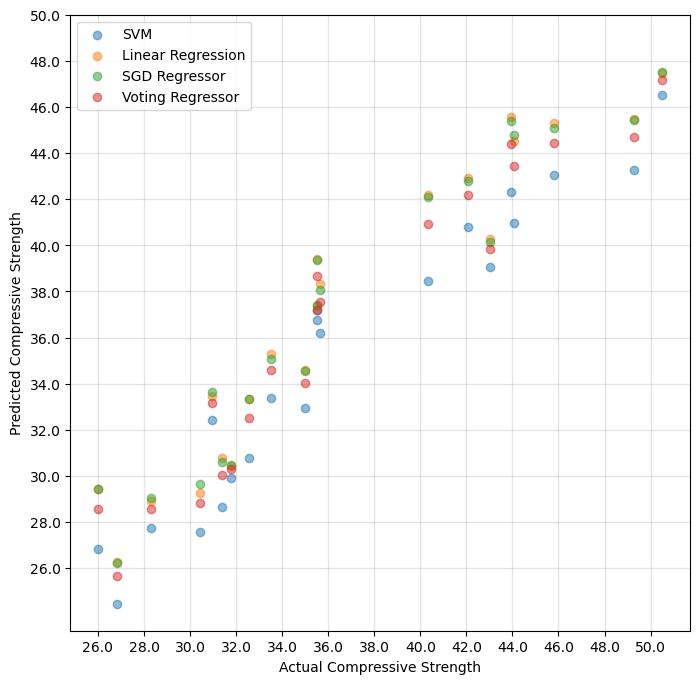

In [60]:
import matplotlib.pyplot as plt

# SVM RMSE (tuned): 2.1494
# Linear Regression RMSE (tuned): 2.0685
# SGD Regressor RMSE (tuned): 2.0734
# Voting Regressor RMSE (tuned): 2.0736


fig, ax = plt.subplots(figsize=(8, 8))

plt.xlabel('Actual Compressive Strength')
plt.ylabel('Predicted Compressive Strength')

# Plot ground truth values vs predicted values for SVM regressor
ax.scatter(y_test, svm_pred, label='SVM', alpha=0.5)

# Plot ground truth values vs predicted values for Linear Regression
ax.scatter(y_test, lr_pred, label='Linear Regression', alpha=0.5)

# Plot ground truth values vs predicted values for SGD Regressor
ax.scatter(y_test, sgd_pred, label='SGD Regressor', alpha=0.5)

# Plot ground truth values vs predicted values for Voting Regressor
ax.scatter(y_test, voting_pred, label='Voting Regressor', alpha=0.5)

grid_size = 2
ax.grid(which='major', axis='both', linestyle='-', color='k', linewidth=1, alpha=0.1, zorder=0)
x_ticks = np.arange(np.round(y_test.min(), 0), y_test.max(), grid_size)
y_ticks = np.arange(np.round(y_test.min(), 0), y_test.max(), grid_size)
ax.set_xticks(x_ticks)
ax.set_yticks(y_ticks)
ax.set_xticklabels(x_ticks)
ax.set_yticklabels(y_ticks)

plt.legend()

# Display the plot
plt.show()


- [ ] Individually tune a few hyperparameters for each of these base estimators. You can use 3-fold cross-validation with Grid-Search to select the best hyperparameters. 

- [ ] Then, repeat the previous task with the selected set of hyperparameters for each base estimator.

- [ ] Compare and comment on the results.

In [61]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import LinearSVR

# Define the parameter grid
param_grid = {'C': [0.01, 0.1, 1, 10, 100, 1000], 'epsilon' : [ 0.1, 0.2, 0.3, 0.4, 0.5, 0.6]}

# Create a LinearSVR object
svm = LinearSVR(random_state=123)

# Create a GridSearchCV object
svm_grid = GridSearchCV(svm, param_grid, cv=3)

# Fit the GridSearchCV object to the training data
svm_grid.fit(X_train, y_train)

# Print the best hyperparameters
svm_best_params = svm_grid.best_params_

print(svm_best_params)

# Train each estimator with the best hyperparameters
svm_tuned = LinearSVR(**svm_best_params)
svm_tuned.fit(X_train, y_train)


{'C': 100, 'epsilon': 0.5}


LinearSVR(C=100, epsilon=0.5)

In [62]:
svm_tuned.fit(X_train, y_train)

LinearSVR(C=100, epsilon=0.5)

In [63]:
svm_preds_tuned = svm_tuned.predict(X_test)
svm_rmse_tuned = mean_squared_error(y_test, svm_preds_tuned, squared=False)

In [64]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression, SGDRegressor
from sklearn.svm import LinearSVR
from sklearn.ensemble import VotingRegressor
from sklearn.metrics import mean_squared_error

# Define the parameter grids for each estimator
svm_param_grid = {
    'C': [0.1, 1, 10, 100],
    'epsilon' : [0.1, 0.2, 0.3, 0.4, 0.5, 0.6]
}

lr_param_grid ={
    'fit_intercept': [True, False],
    'positive': [True, False]
}

sgd_param_grid = {
    'loss': ['squared_error', 'huber', 'epsilon_insensitive'],
    'penalty': ['l2', 'l1', 'elasticnet'],
    'alpha': [0.0001, 0.001, 0.01],
    'learning_rate': ['constant', 'invscaling', 'adaptive']
}

# Create the base estimators with default hyperparameters
svm = LinearSVR(random_state=123)
lr = LinearRegression()
sgd = SGDRegressor(random_state=123)

# Create a GridSearchCV object for each estimator
svm_grid = GridSearchCV(svm, svm_param_grid, cv=3)
lr_grid = GridSearchCV(lr, lr_param_grid, cv=3)
sgd_grid = GridSearchCV(sgd, sgd_param_grid, cv=3)

# # Fit the GridSearchCV objects to the training data
svm_grid.fit(X_train, y_train)
lr_grid.fit(X_train, y_train)
sgd_grid.fit(X_train, y_train)

# Get the best hyperparameters for each estimator
svm_best_params = svm_grid.best_params_
lr_best_params = lr_grid.best_params_
sgd_best_params = sgd_grid.best_params_

# Train each estimator with the best hyperparameters
svm_tuned = LinearSVR(**svm_best_params)
svm_tuned.fit(X_train, y_train)
lr_tuned = LinearRegression(**lr_best_params)
lr_tuned.fit(X_train, y_train)

sgd_tuned = SGDRegressor(**sgd_best_params)
sgd_tuned.fit(X_train, y_train)

# Train the Voting Regressor with the tuned base estimators
voting_tuned = VotingRegressor([('svm', svm_tuned), ('lr', lr_tuned), ('sgd', sgd_tuned)])
voting_tuned.fit(X_train, y_train)

# Get the predictions for the test set
svm_preds_tuned = svm_tuned.predict(X_test)
lr_preds_tuned = lr_tuned.predict(X_test)
sgd_preds_tuned = sgd_tuned.predict(X_test)
voting_preds_tuned = voting_tuned.predict(X_test)

# Calculate the RMSE for each model
svm_rmse_tuned = mean_squared_error(y_test, svm_preds_tuned, squared=False)
lr_rmse_tuned = mean_squared_error(y_test, lr_preds_tuned, squared=False)
sgd_rmse_tuned = mean_squared_error(y_test, sgd_preds_tuned, squared=False)
voting_rmse_tuned = mean_squared_error(y_test, voting_preds_tuned, squared=False)

# Print the RMSE for each model
print(f"SVM RMSE (tuned): {svm_rmse_tuned:.4f}")
print(f"Linear Regression RMSE (tuned): {lr_rmse_tuned:.4f}")
print(f"SGD Regressor RMSE (tuned): {sgd_rmse_tuned:.4f}")
print(f"Voting Regressor RMSE (tuned): {voting_rmse_tuned:.4f}")


SVM RMSE (tuned): 2.1960
Linear Regression RMSE (tuned): 2.0685
SGD Regressor RMSE (tuned): 2.0569
Voting Regressor RMSE (tuned): 2.0297


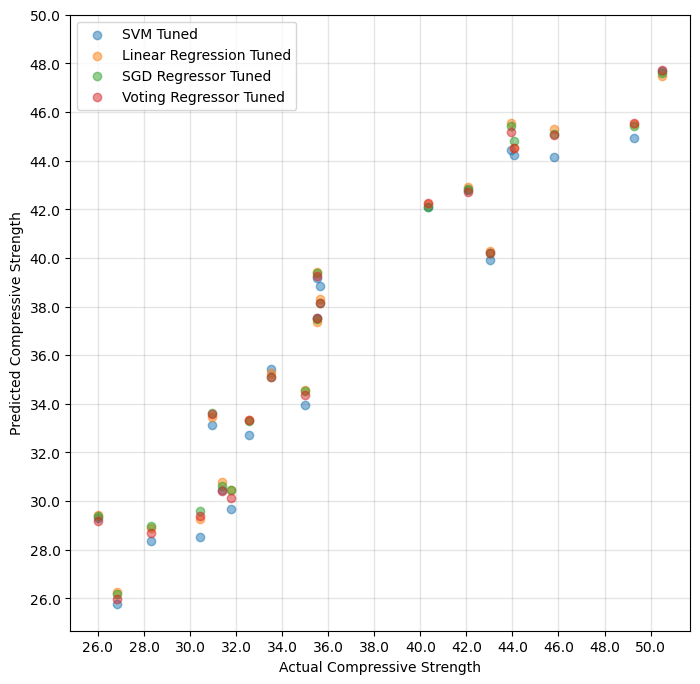

In [65]:
import matplotlib.pyplot as plt


fig, ax = plt.subplots(figsize=(8, 8))

plt.xlabel('Actual Compressive Strength')
plt.ylabel('Predicted Compressive Strength')

# Plot ground truth values vs predicted values for SVM regressor
ax.scatter(y_test, svm_preds_tuned, label='SVM Tuned', alpha=0.5)

# Plot ground truth values vs predicted values for Linear Regression
ax.scatter(y_test, lr_preds_tuned, label='Linear Regression Tuned', alpha=0.5)

# Plot ground truth values vs predicted values for SGD Regressor
ax.scatter(y_test, sgd_preds_tuned, label='SGD Regressor Tuned', alpha=0.5)

# Plot ground truth values vs predicted values for Voting Regressor
ax.scatter(y_test, voting_preds_tuned, label='Voting Regressor Tuned', alpha=0.5)

grid_size = 2
ax.grid(which='major', axis='both', linestyle='-', color='k', linewidth=1, alpha=0.1, zorder=0)
x_ticks = np.arange(np.round(y_test.min(), 0), y_test.max(), grid_size)
y_ticks = np.arange(np.round(y_test.min(), 0), y_test.max(), grid_size)
ax.set_xticks(x_ticks)
ax.set_yticks(y_ticks)
ax.set_xticklabels(x_ticks)
ax.set_yticklabels(y_ticks)

plt.legend()

# Display the plot
plt.show()


### Abalone dataset

An Abalone dataset is available in the UCI Machine Learning Repository website below:
https://archive.ics.uci.edu/ml/datasets/Abalone

It has 4177 instances with 8 attributes and a column that describes the age, represented in terms of the
number of rings, of the abalones.

For any new test instance, we want our regressor to be able to predict
this value. The dataset in csv format is in the abalone.data file which can be downloaded from
https://archive.ics.uci.edu/ml/machine-learning-databases/abalone/


- [ ] You should save the file abalone.data to the same directory with your Jupyter Notebook file. Do not rename or modify the file in any way.

This part of the assignment includes the following tasks

- [ ] Read in the contents of the file and perform the usual data inspection and cleaning if needed.
- [ ] Perform appropriate data preprocessing to the data, e.g., you can either drop the text column or convert it into numerical values.
- [ ] Do an 85/15 random split to form a training set and a test set.

Given is the attribute name, attribute type, the measurement unit and a brief description. The number of rings is the value to predict: either as a continuous value or as a classification problem.

| Name         | Data Type  | Measurement Unit | Description                                       |
|--------------|------------|------------------|---------------------------------------------------|
| Sex          | nominal    | --               | M, F, and I (infant)                              |
| Length       | continuous | mm               | Longest shell measurement                         |
| Diameter     | continuous | mm               | Perpendicular to length                           |
| Height       | continuous | mm               | With meat in shell                                 |
| Whole weight | continuous | grams            | Whole abalone weight                              |
| Shucked weight | continuous | grams          | Weight of meat                                     |
| Viscera weight | continuous | grams          | Gut weight (after bleeding)                        |
| Shell weight | continuous | grams            | Shell weight (after being dried)                   |
| Rings        | integer    | --               | +1.5 gives the age in years                        |



In [66]:
import pandas as pd
import numpy as np
# from sklearn.model_selection import train_test_split

# read in the csv file
abalone_df = pd.read_csv('abalone.data', header=None)

column_names = ["sex", "length", "diameter", "height", "whole_weight", "shucked_weight",
                "viscera_weight", "shell_weight", "rings"]

# add column names to the dataframe
abalone_df.columns = column_names
# convert categorical variable 'sex' into numerical values
# abalone_df['sex'] = pd.factorize(abalone_df['sex'])[0]

In [67]:
abalone_df.head()

,sex,length,diameter,height,whole_weight,shucked_weight,viscera_weight,shell_weight,rings
0,M,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.150,15
1,M,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.070,7
2,F,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.210,9
3,M,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.155,10
4,I,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.055,7


In [68]:
# check for missing values
print(abalone_df.isnull().sum())

sex               0
length            0
diameter          0
height            0
whole_weight      0
shucked_weight    0
viscera_weight    0
shell_weight      0
rings             0
dtype: int64


The above table shows that there is no missing data in our dataset.

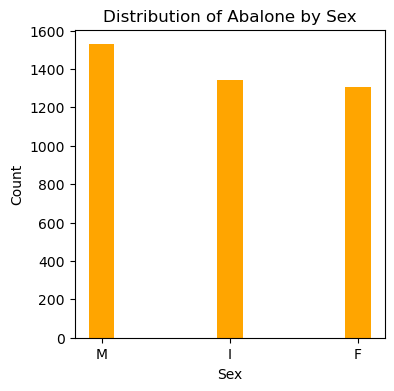

M    1528
I    1342
F    1307
Name: sex, dtype: int64

In [69]:
import matplotlib.pyplot as plt

# Create data
count_by_sex = abalone_df['sex'].value_counts()

# Create horizontal bar plot with adjusted size
fig, ax = plt.subplots(figsize=(4, 4))
ax.bar(count_by_sex.index, count_by_sex.values, color='orange', width=0.2)

# Set axis labels and title
ax.set_xlabel('Sex')
ax.set_ylabel('Count')
ax.set_title('Distribution of Abalone by Sex')

plt.show()

count_by_sex

The above distribution shows that the number of males `M` in dataset is more than infants `I` and females `F`. However, the number of `I` and `F` are almost the same


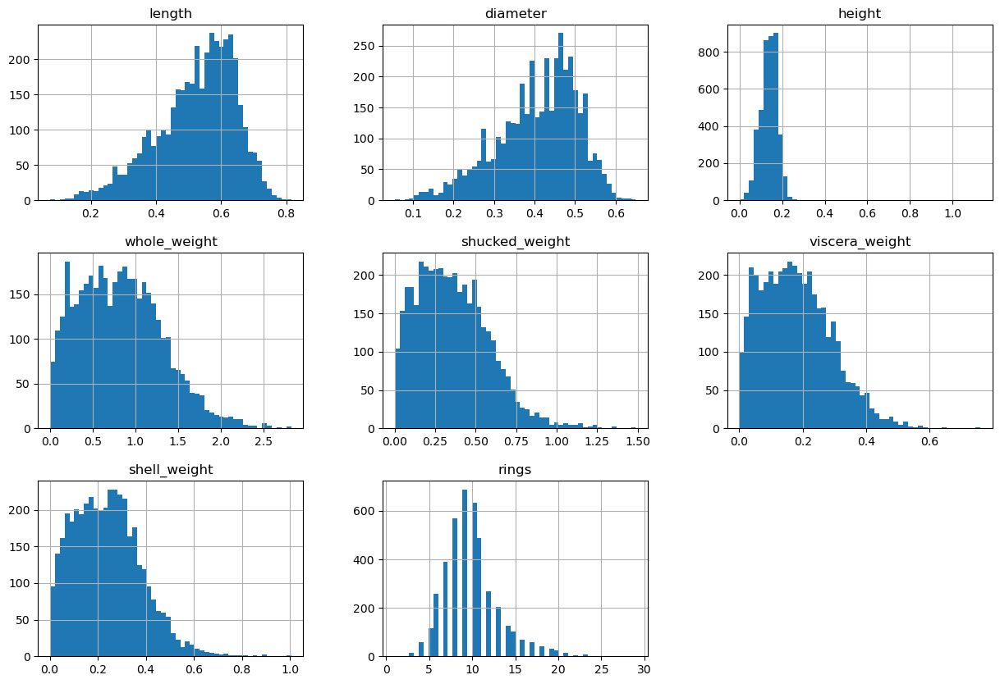

In [70]:
abalone_df.hist(bins=50, figsize=(15,10))
plt.show()

The distribution of data by length and diameter is left skewed whereas the distribution of data by `whole weight`, `shucked weight`, `viscera weight` and `shell weight` is right skewed. The distribution of data by `rings` seems to be categorical. The analysis of the Abalone dataset indicates that the distribution of the length and diameter features is skewed to the left, while the distribution of the whole weight, shucked weight, viscera weight, and shell weight features is skewed to the right. Furthermore, the rings feature appears to be categorical in nature. These observations suggest that the data may not follow a normal distribution and may require transformation or alternative approaches to address this non-normality in statistical analysis.

As `sex` is a categorical variable in textual format. However, assigning numerical values such as 0, 1, and 3 may lead to biased results. Therefore, one-hot encoding is performed to represent the variable numerically.

In [71]:
# from sklearn.preprocessing import OneHotEncoder

# encoder = OneHotEncoder(sparse=False)
# encoded_sex = encoder.fit_transform(abalone_df[['sex']])
# abalone_encoded = pd.concat([abalone_df.drop('sex', axis=1), pd.DataFrame(encoded_sex, columns=encoder.categories_[0])], axis=1)

# (abalone_encoded.head())

In [72]:
# convert sex column into numerical values using one-hot encoding
abalone_df = pd.get_dummies(abalone_df, columns=["sex"])

In [73]:
abalone_df

,length,diameter,height,whole_weight,shucked_weight,viscera_weight,shell_weight,rings,sex_F,sex_I,sex_M
0,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.1500,15,0,0,1
1,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.0700,7,0,0,1
2,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.2100,9,1,0,0
3,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.1550,10,0,0,1
4,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.0550,7,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...
4172,0.565,0.450,0.165,0.8870,0.3700,0.2390,0.2490,11,1,0,0
4173,0.590,0.440,0.135,0.9660,0.4390,0.2145,0.2605,10,0,0,1
4174,0.600,0.475,0.205,1.1760,0.5255,0.2875,0.3080,9,0,0,1
4175,0.625,0.485,0.150,1.0945,0.5310,0.2610,0.2960,10,1,0,0


In [74]:
num_columns =  [col for col in list(abalone_df.columns) if col not in ('sex_F', 'sex_I', 'sex_M')]

# item_list = [e for e in item_list if e not in ('item', 5)]
num_columns

['length',
 'diameter',
 'height',
 'whole_weight',
 'shucked_weight',
 'viscera_weight',
 'shell_weight',
 'rings']

Number of outliers for length: 49
Number of outliers for diameter: 59
Number of outliers for height: 29
Number of outliers for whole_weight: 30
Number of outliers for shucked_weight: 48
Number of outliers for viscera_weight: 26
Number of outliers for shell_weight: 35
Number of outliers for rings: 278


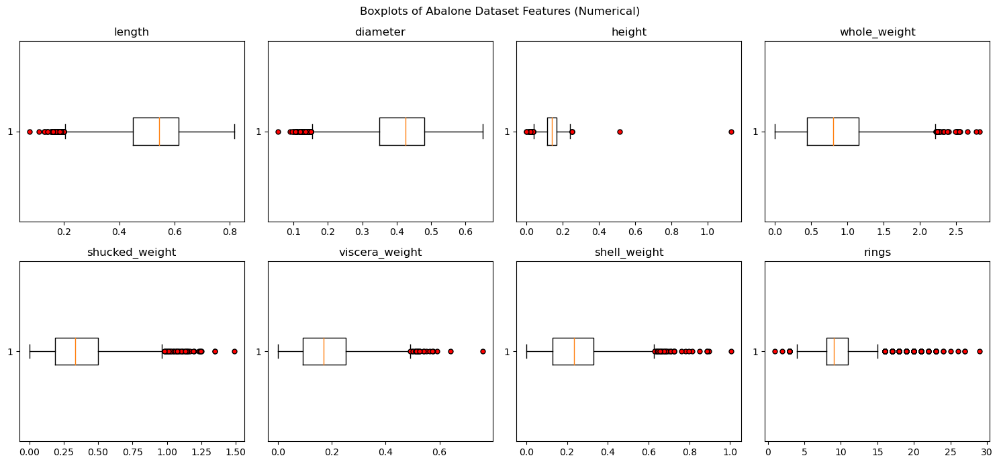

In [75]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(nrows=2, ncols=4, figsize=(15, 7))

for i, feature in enumerate(num_columns):
    row = i // 4
    col = i % 4
        
    bp = axs[row, col].boxplot(abalone_df[feature], vert=False, 
                               flierprops=dict(marker='o', markersize=5, linestyle='none', linewidth=0.05, markerfacecolor='red'))
    axs[row, col].set_title(feature)
    outliers = [flier.get_xdata() for flier in bp["fliers"]]
    num_outliers = len(outliers[0])
    print(f"Number of outliers for {feature}: {num_outliers}")


fig.suptitle('Boxplots of Abalone Dataset Features (Numerical)')
plt.tight_layout()
plt.show()

There appear to be a considerable number of outliers in each of the features, but due to the relatively small size of the dataset, we will not remove them in this case.

In [76]:
# # split into train and test sets
X = abalone_df.drop('rings', axis=1)
y = abalone_df['rings']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42)


# NOTE:  ADD STRATIFY
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=123, stratify=y)

In [77]:
print(f"Training set (X_train, y_train) -> {len(X_train)}")
print(f"Test set (X_test, y_test) -> {len(X_test)}")

Training set (X_train, y_train) -> 3550
Test set (X_test, y_test) -> 627


Splitting the data into 85/15 random split to form a training set and a test set such that we have 3550 instances of training set and 627 of test dataset

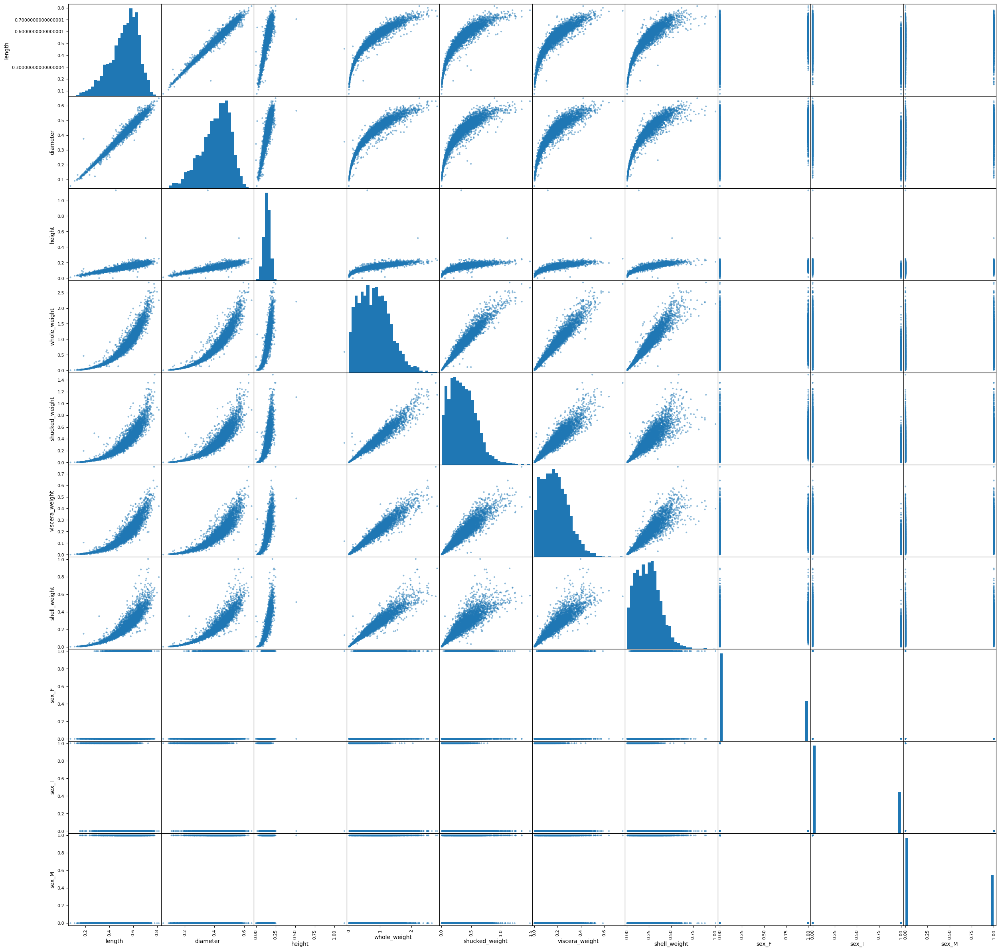

In [78]:
scatter_matrix_plot = scatter_matrix(X, figsize=(30, 30), diagonal='hist', hist_kwds={'bins': 30})

# Add title here and good titles iin all the figures

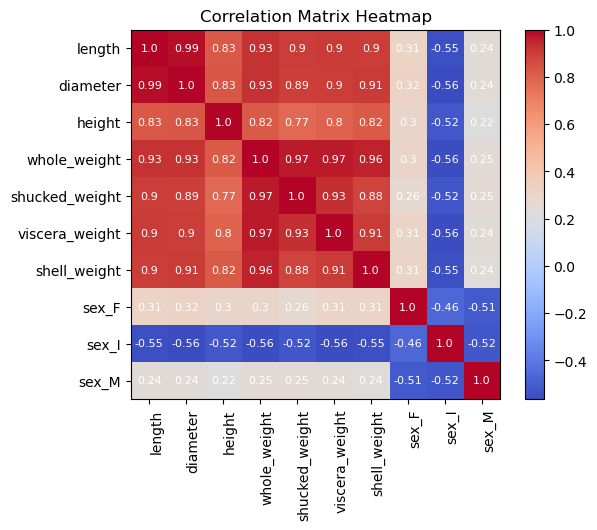

In [79]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt




# calculate the correlation matrix
corr_matrix = X.corr()

# create the heatmap plot

fig, ax = plt.subplots()
im = ax.imshow(corr_matrix, cmap='coolwarm')

# add a colorbar
cbar = ax.figure.colorbar(im, ax=ax)

# set the axis labels
ax.set_xticks(np.arange(len(corr_matrix.columns)))
ax.set_yticks(np.arange(len(corr_matrix.columns)))
ax.set_xticklabels(corr_matrix.columns)
ax.set_yticklabels(corr_matrix.columns)

# rotate the tick labels and set their alignment
plt.setp(ax.get_xticklabels(), rotation=90, ha="right", rotation_mode="anchor")

# add the correlation coefficients in each cell of the heatmap
for i in range(len(corr_matrix.columns)):
    for j in range(len(corr_matrix.columns)):
        text = ax.text(j, i, round(corr_matrix.iloc[i, j], 2), ha="center", va="center", color="w", fontsize=8)

# set the title
ax.set_title("Correlation Matrix Heatmap")

# show the plot
plt.show()


The scatter plot and the correlation matrix illustrate that most of the features are strongly correlated with each other, which is not surprising. For instance, the length of the abalone shell tends to be positively associated with the height of the shell. Similarly, the weight of the abalone as a whole, as well as its different components (i.e., viscera, shell, and shucked weight), and the diameter of the shell also tend to increase with the increase in length and height of the abalone shell.

**Key Take away from scatter plot**
1. The scatter plot suggests that there exists a linear correlation between the length, height, and diameter.
2. There is non-linear relationship between the length and the various factors including whole weight, viscera weight, shell weight, and viscera weight. This implies that the relationship between the length and these factors can be represented by a polynomial function with multiple degrees, allowing for more complex patterns and interactions to be captured.


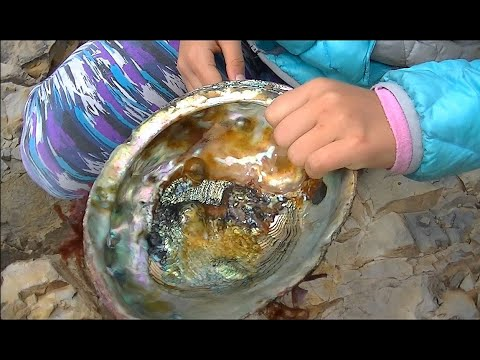

In [80]:
from IPython.display import YouTubeVideo

video = YouTubeVideo('zErZjm9G1hU')

display(video)


- [ ] Train a Decision Tree Regression using a 3-fold cross-validation to tune max depth, letting all other hyperparameters in their default values. Make a plot of the training errors, cross-validation errors and test errors as a function max depth. Comment on the results. What value of max depth would you choose? 


To train a regression decision tree using a 3-fold cross-validation to tune max depth, we have splitted our data into a training set `X_train` and a test set `X_test` above. 


In [81]:
np.arange(1, 21)

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20])

In [82]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
import numpy as np

parameters = {'max_depth': np.arange(1, 21)}
dt_reg = DecisionTreeRegressor(random_state=42)
dt_reg_cv = GridSearchCV(dt_reg, parameters, cv=3)
dt_reg_cv.fit(X_train, y_train)


GridSearchCV(cv=3, estimator=DecisionTreeRegressor(random_state=42),
             param_grid={'max_depth': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20])})

In [83]:
dt_reg_cv.best_estimator_

DecisionTreeRegressor(max_depth=4, random_state=42)

In [84]:
print("Best parameters:", dt_reg_cv.best_params_)
print("Best score:", dt_reg_cv.best_score_)



Best parameters: {'max_depth': 4}
Best score: 0.4528736205195141


From the output of the code above, we can see that the best value for max_depth is 4 with a cross-validation score of 0.45.

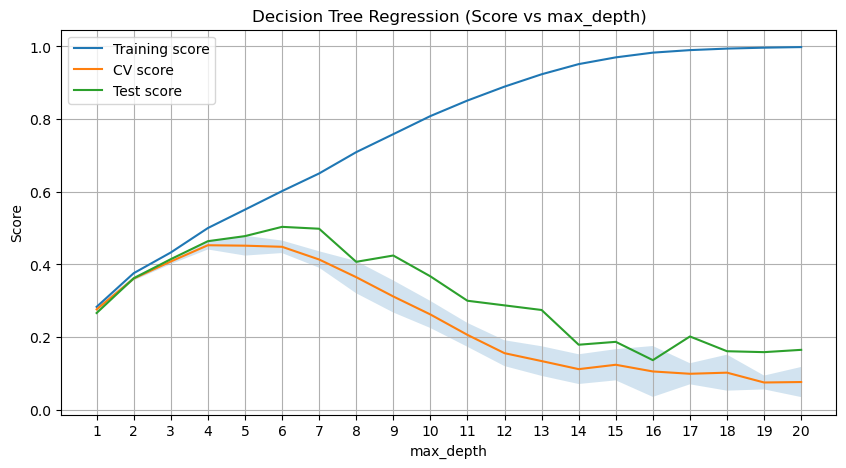

In [85]:
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score


train_scores, test_scores = [], []

cv_scores, cv_std = [], []

for max_depth in parameters['max_depth']:
    tree = DecisionTreeRegressor(random_state=42, max_depth=max_depth)
    tree.fit(X_train, y_train)

    train_scores.append(tree.score(X_train, y_train))
    test_scores.append(tree.score(X_test, y_test))

    scores = cross_val_score(tree, X_train, y_train, cv=3)
    cv_scores.append(scores.mean())
    cv_std.append(scores.std())

plt.figure(figsize=(10, 5))
plt.plot(parameters['max_depth'], train_scores, label='Training score')
plt.plot(parameters['max_depth'], cv_scores, label='CV score')
plt.plot(parameters['max_depth'], test_scores, label='Test score')
plt.fill_between(parameters['max_depth'], np.array(cv_scores) - np.array(cv_std), np.array(cv_scores) + np.array(cv_std), alpha=0.2)
plt.legend()
plt.xlabel('max_depth')
plt.ylabel('Score')
plt.title('Decision Tree Regression (Score vs max_depth)')



# Set xticks at every 0.5 x value
xticks = [i + 1 for i in range(len(parameters['max_depth'] - 1))]
plt.xticks(xticks, [str(d) for d in parameters['max_depth']])

# Add grid lines
plt.grid(True)
# plt.grid()
plt.show()


The `score()` method in the Decision Tree Regression model returns the coefficient of determination $R^2$, which is a measure of the proportion of variance in the dependent variable that can be explained by the independent variables in the model. A higher $R^2$ value indicates a better fit between the model and the data.

In the plot above, we can observe that the training score increases as the `max_depth` increases, indicating that the model is overfitting the data. However, the cross-validation score increases until a `max_depth` of 4 and then starts to decrease, indicating that the model's generalization performance starts to degrade after `max_depth=4`. Therefore, we can choose a max_depth of 4 as the optimal parameter, as this would help prevent overfitting and achieve good generalization performance. 

However, when we tested the model on the test data, we found that the model performed best with a `max_depth` of 6. This indicates that the model may be able to capture some additional complexity in the test data with a slightly higher `max_depth` value, although this could also be due to randomness in the test set.
 

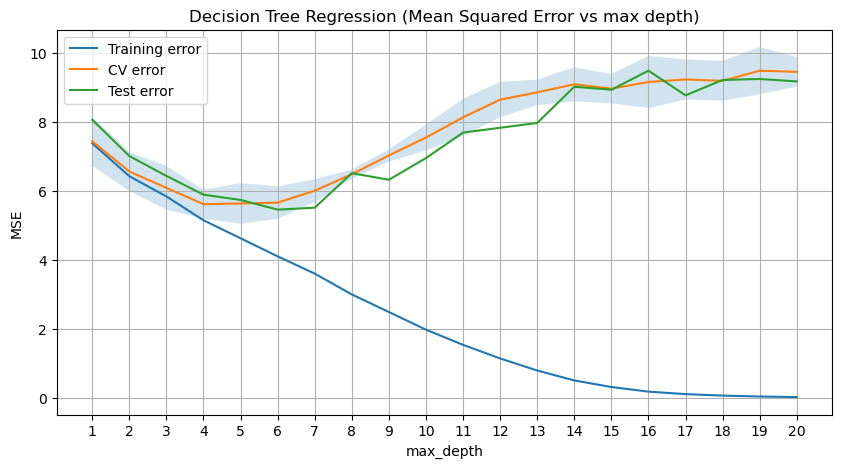

In [86]:
train_errors, test_errors = [], []
cv_errors, cv_std = [], []

for max_depth in parameters['max_depth']:
    tree = DecisionTreeRegressor(random_state=42, max_depth=max_depth)
    tree.fit(X_train, y_train)

    y_train_pred = tree.predict(X_train)
    train_errors.append(mean_squared_error(y_train, y_train_pred))

    y_test_pred = tree.predict(X_test)
    test_errors.append(mean_squared_error(y_test, y_test_pred))

    cv_scores = -cross_val_score(tree, X_train, y_train, cv=3, scoring='neg_mean_squared_error')
    # print(cv_scores)
    cv_errors.append(cv_scores.mean())
    cv_std.append(cv_scores.std())

plt.figure(figsize=(10, 5))
plt.plot(parameters['max_depth'], train_errors, label='Training error')
plt.plot(parameters['max_depth'], cv_errors, label='CV error')
plt.plot(parameters['max_depth'], test_errors, label='Test error')
plt.fill_between(parameters['max_depth'], np.array(cv_errors) - np.array(cv_std), np.array(cv_errors) + np.array(cv_std), alpha=0.2)
plt.legend()
plt.xlabel('max_depth')
plt.ylabel('MSE')
plt.title('Decision Tree Regression (Mean Squared Error vs max depth)')


xticks = [i + 1 for i in range(len(parameters['max_depth'] - 1))]
plt.xticks(xticks, [str(d) for d in parameters['max_depth']])

plt.grid(True)
plt.show()


In the plot of `Mean Squared Error (MSE) vs max_depth`, we observe that the training error decreases as the max_depth increases, indicating that the model is overfitting the data. However, the cross-validation error initially decreases until `max_depth=4` and then starts to increase, indicating that the model's generalization performance starts to degrade after this point.

When we test the model on the independent test dataset, we found that the model achieved the `lowest MSE value` when `max_depth` is set to 6. However, it is important to note that this result may be influenced by the random nature of the test data or the specific characteristics of the test set. Therefore, we cannot conclusively determine whether the model is fitting additional complexity beyond a `max_depth` of 4, or whether the observed performance is simply a result of randomness in the data.

- [ ] Train a Decision Tree Regression using a 3-fold cross-validation to tune min samples leaf, using max depth as selected in the previous task and letting all other hyperparameters in their default values. 

- [ ] Make a plot of the training errors, cross-validation errors and test errors as a function min samples leaf. Comment on the results.

In [87]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
import numpy as np

parameters = {'min_samples_leaf': np.arange(1, 100)}
dt_reg = DecisionTreeRegressor(random_state=42, max_depth=4)
dt_reg_cv = GridSearchCV(dt_reg, parameters, cv=3)
dt_reg_cv.fit(X_train, y_train)

GridSearchCV(cv=3,
             estimator=DecisionTreeRegressor(max_depth=4, random_state=42),
             param_grid={'min_samples_leaf': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
       52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68,
       69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85,
       86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99])})

In [88]:
dt_reg_cv.best_params_

{'min_samples_leaf': 45}

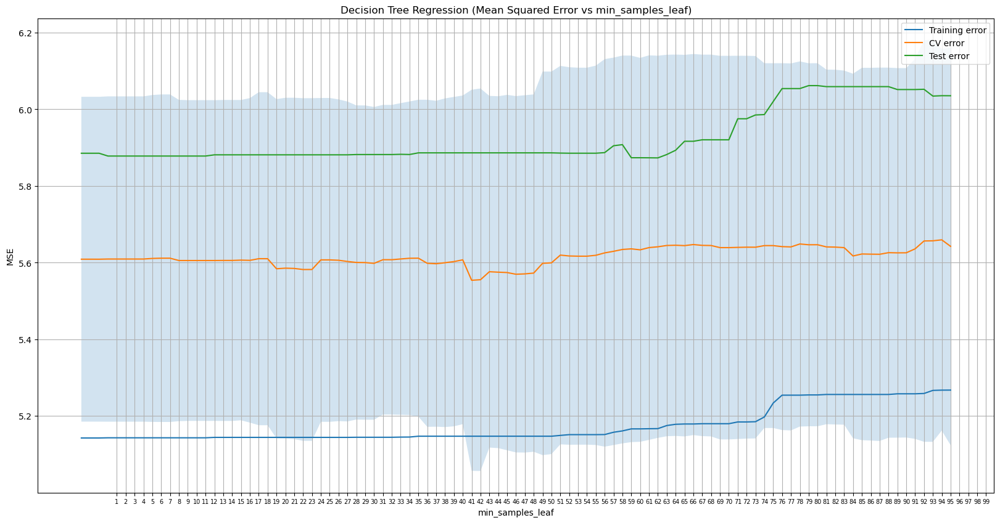

In [89]:
train_errors, test_errors = [], []
cv_errors, cv_std = [], []

for leaf in parameters['min_samples_leaf']:
    tree = DecisionTreeRegressor(random_state=42, max_depth=4, min_samples_leaf=leaf)
    tree.fit(X_train, y_train)

    y_train_pred = tree.predict(X_train)
    train_errors.append(mean_squared_error(y_train, y_train_pred))

    y_test_pred = tree.predict(X_test)
    test_errors.append(mean_squared_error(y_test, y_test_pred))

    cv_scores = -cross_val_score(tree, X_train, y_train, cv=3, scoring='neg_mean_squared_error')
    # print(cv_scores)
    cv_errors.append(cv_scores.mean())
    cv_std.append(cv_scores.std())

plt.figure(figsize=(20,10))
plt.plot(parameters['min_samples_leaf'], train_errors, label='Training error')
plt.plot(parameters['min_samples_leaf'], cv_errors, label='CV error')
plt.plot(parameters['min_samples_leaf'], test_errors, label='Test error')
plt.fill_between(parameters['min_samples_leaf'], np.array(cv_errors) - np.array(cv_std), np.array(cv_errors) + np.array(cv_std), alpha=0.2)
plt.legend()
plt.xlabel('min_samples_leaf')
plt.ylabel('MSE')
plt.title('Decision Tree Regression (Mean Squared Error vs min_samples_leaf)')


xticks = [i + 5 for i in range(len(parameters['min_samples_leaf'] - 1))]
plt.xticks(xticks, [str(d) for d in parameters['min_samples_leaf']], fontsize=7)

plt.grid(True)
plt.show()




The `GridSearchCV` shows that the optimal value for `min_samples_leaf` is 45. 

From the error plots, we can observe that the regression tree is not much affected by the `min_samples_leaf` when we choose the `max_depth=4`.

We can observe that the training error is the lowest when `min_samples_leaf` is small, which is expected as a more flexible model tends to fit the training data better. However, this can lead to overfitting, where the model is too complex and captures noise in the data. On the other hand, setting a large `min_samples_leaf` can lead to underfitting, where the model is too simple and fails to capture the underlying patterns in the data. 

As we increase the value of `min_samples_leaf`, the error tends to increase for all three sets: training, validation, and test. However, we notice that the validation error is lowest around a `min_samples_leaf` value of 40. Therefore, if we had to choose the optimal value based on the error plots and the `GridSearchCV`, we would select a `min_samples_leaf` of around 45.

- [ ] Implement a Random Forest regressor with 500 estimators. You can use max depth, and min samples leaf as selected before and manually experiment with other hyperparameters, such as max samples, max features, bootstrap, etc.

- [ ] Train your Random Forest regressor on the training set and test it on the test set. You can Report its RMSE for the predictions on the test set.

Note: as the ring values must be integers, the predicted results from your Random Forest regressor must be firstly rounded to the nearest integer before the RMSE computation. 

In [90]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
import numpy as np

# Initialize the random forest regressor with 500 estimators
rf_regressor = RandomForestRegressor(n_estimators=500, max_depth=4, min_samples_leaf=45,
                                     max_features='sqrt', n_jobs=-1, bootstrap=True,
                                     random_state=42)



# Fit the regressor to the training data
rf_regressor.fit(X_train, y_train)

# Make predictions on the test set and round to the nearest integer
y_pred = np.round(rf_regressor.predict(X_test))

# Calculate the RMSE of the predictions
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print("Random Forest Regressor RMSE:", rmse)


Random Forest Regressor RMSE: 2.4367599477712614


In [91]:

# # NOTE: TRYING TO FIND BEST PARAMETER IN THIS CASE IS EXPENSIVE AND TAKES SEVERAL MINUTES TO RUN

# parameters = {
#     'max_features': ['sqrt', 1.0, 'log2' ],
#     'bootstrap': [True, False],
#     'max_samples': np.arange(1, len(X_train))

# }
# # max_features: The number of features to consider when looking for the best split:

# #     - If int, then consider `max_features` features at each split.
# #     - If float, then `max_features` is a fraction and
# #       `max(1, int(max_features * n_features_in_))` features are considered at each
# #       split.
# #     - If "auto", then `max_features=n_features`.
# #     - If "sqrt", then `max_features=sqrt(n_features)`.
# #     - If "log2", then `max_features=log2(n_features)`.
# #     - If None or 1.0, then `max_features=n_features`.

# rf_regressor = RandomForestRegressor(n_estimators=500, max_depth=4, min_samples_leaf=45, random_state=42, n_jobs=-1)

# # dt_reg = DecisionTreeRegressor(random_state=42, max_depth=4,  )
# rf_regressor_cv = GridSearchCV(rf_regressor, parameters, cv=3)
# rf_regressor_cv.fit(X_train, y_train)

In [92]:
# rf_regressor_cv.best_params_

- [ ] Use the feature importances obtained from the training process to trim the feature dimension of the data. In your Python code, you should retain only those features whose importance values are above 5% (i.e., 0.05)1. You can either write your own Python code or use the function SelectFromModel from the sklearn.feature selection package to work out which feature(s) can be removed.

- [ ] Report what features were retained and what features were removed in the above process. What is the total feature importance value that is retained after your dimension reduction step?

In [93]:

# Use feature importances to select relevant features
feature_importances = rf_regressor.feature_importances_

for score, feature in zip(feature_importances, X.columns):
    print(f'{feature} -> Feature Score: {round(score, 2)}')
    
print('\n')

selected_features = X_train.columns[feature_importances > 0.05]

# Trim the feature dimension of the data
X_train_reduced = X_train[selected_features]
X_test_reduced = X_test[selected_features]

# Report the retained and removed features
removed_features = X_train.columns[feature_importances <= 0.05]
print("Retained features:", list(selected_features))
print("Removed features:", list(removed_features))

# Calculate the total feature importance value retained after dimension reduction
total_importance = feature_importances[feature_importances > 0.05].sum()
print("Total feature importance value retained:", total_importance)


length -> Feature Score: 0.04
diameter -> Feature Score: 0.12
height -> Feature Score: 0.19
whole_weight -> Feature Score: 0.12
shucked_weight -> Feature Score: 0.06
viscera_weight -> Feature Score: 0.1
shell_weight -> Feature Score: 0.35
sex_F -> Feature Score: 0.0
sex_I -> Feature Score: 0.02
sex_M -> Feature Score: 0.0


Retained features: ['diameter', 'height', 'whole_weight', 'shucked_weight', 'viscera_weight', 'shell_weight']
Removed features: ['length', 'sex_F', 'sex_I', 'sex_M']
Total feature importance value retained: 0.9337556729001344


In [94]:
X_train_reduced.head()


,diameter,height,whole_weight,shucked_weight,viscera_weight,shell_weight
1815,0.515,0.185,1.3405,0.5595,0.2930,0.4375
1128,0.440,0.155,0.6405,0.3360,0.1765,0.2450
790,0.465,0.160,0.8935,0.3145,0.2575,0.2630
3154,0.410,0.130,0.5600,0.2375,0.1065,0.1750
2647,0.390,0.125,0.5830,0.2940,0.1320,0.1605


 - [ ] Repeat the training and prediction processes above on the reduced-dimensional data. We expect to see a slight increase of RMSE for the reduced-dimensional data. In many real applications, the feature dimension of the data may be reduced drastically with only a slight increase in the prediction error. We won’t see this in this small dataset as the feature dimension is already quite small. 

In [95]:
# from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

# Use feature importances to select relevant features
threshold = 0.05


rf_regressor_reduced = RandomForestRegressor(n_estimators=500, max_depth=4, min_samples_leaf=45,
                                     max_features='sqrt', n_jobs=-1, bootstrap=True,
                                     random_state=42)

rf_regressor_reduced.fit(X_train_reduced, y_train)

# Make predictions on reduced test data
y_pred_reduced = rf_regressor_reduced.predict(X_test_reduced)
y_pred_reduced = np.round(y_pred_reduced)  # Round to nearest integer

# Calculate RMSE for reduced data
rmse_reduced = np.sqrt(mean_squared_error(y_test, y_pred_reduced))
print(f"RMSE on reduced data: {rmse_reduced}")


RMSE on reduced data: 2.4397034881410993


In [96]:
# Compute RMSE for the two models on the test set
y_pred_rf = rf_regressor.predict(X_test)
rmse_rf = np.sqrt(mean_squared_error(y_test, np.round(y_pred_rf)))
y_pred_rf_reduced = rf_regressor_reduced.predict(X_test_reduced)
rmse_rf_reduced = np.sqrt(mean_squared_error(y_test, np.round(y_pred_rf_reduced)))
print('Random Forest with all features - RMSE: {:.3f}'.format(rmse_rf))
print('Random Forest with reduced features - RMSE: {:.3f}'.format(rmse_rf_reduced))

Random Forest with all features - RMSE: 2.437
Random Forest with reduced features - RMSE: 2.440


In [97]:
# Compute prediction errors and group by ring value
errors_rf = np.abs(np.round(y_pred_rf) - y_test)
errors_rf_reduced = np.abs(np.round(y_pred_rf_reduced) - y_test)
df_errors = pd.DataFrame({'Ring': y_test, 'Error': errors_rf})
df_errors_reduced = pd.DataFrame({'Ring': y_test, 'Error': errors_rf_reduced})
grouped_errors = df_errors.groupby('Ring').mean()
grouped_errors_reduced = df_errors_reduced.groupby('Ring').mean()


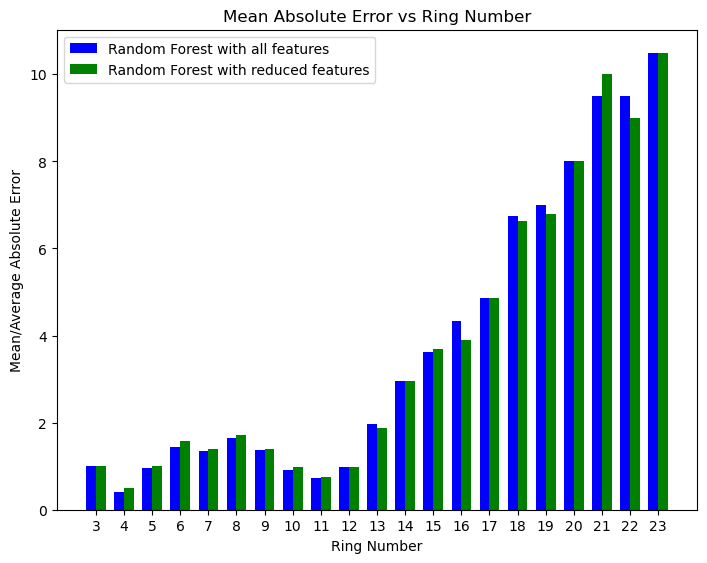

In [98]:
import numpy as np
import matplotlib.pyplot as plt
 
width = 0.35       # the width of the bars
 
# Plotting
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
rects1 = ax.bar(grouped_errors.index, grouped_errors.Error, width, color='b')
rects2 = ax.bar(grouped_errors_reduced.index + width, grouped_errors_reduced.Error, width, color='green')
 
# Add labels, title, and legend
ax.set_ylabel('Mean/Average Absolute Error')
ax.set_xlabel('Ring Number')
ax.set_title('Mean Absolute Error vs Ring Number')
ax.set_xticks(grouped_errors_reduced.index + width / 2)
ax.set_xticklabels(grouped_errors_reduced.index)
ax.legend((rects1[0], rects2[0]), ('Random Forest with all features', 'Random Forest with reduced features'))
 
plt.show()


The above plot shows that our random forest performed porly on the data instances which has large ring value. 

Here are some possible reasons for that. 

1. Imbalanced data: The distribution of the target variable `rings` is right skewed, which means the number of samples with high target values is relatively small compared to those with low target values. Thus, the random forest is biased towards predicting lower target values, resulting in large errors for the high target values.

2. Outliers: Since the right tail contains the extreme values, the random forest is not be able to capture their influence and thus predict poorly on the right tail.

3. Insufficient training samples: Since, the number of samples in the high target value range is small, the random forest does not have enough information to learn the patterns in that range, leading to poor predictions.

4. Insufficient depth or complexity: Since the depth of the random forest is just 4 which is not  complex enough to capture the complex patterns in the right tail of the distribution.




Also, the predictions from `random forest with all features` and `random forest with reducted features` are almost the same

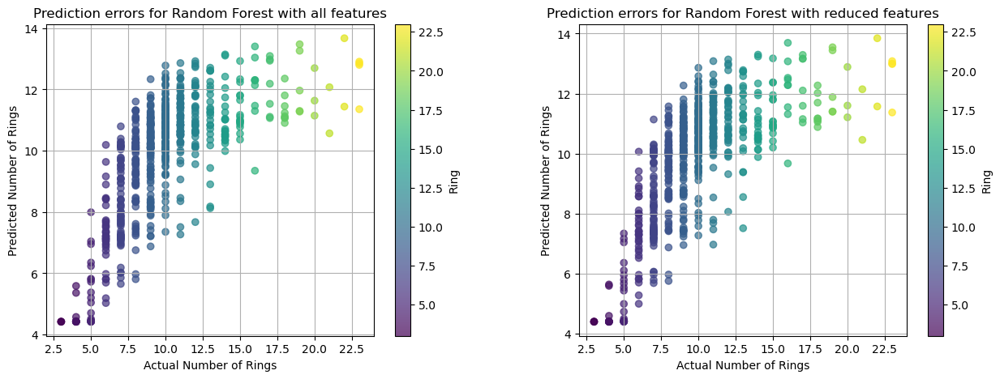

In [99]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# First plot
plt.sca(axs[0])
plt.scatter(y_test, y_pred_rf, c=y_test,  alpha=0.7)
plt.colorbar(label='Ring')
plt.xlabel('Actual Number of Rings')
plt.ylabel('Predicted Number of Rings')
plt.title('Prediction errors for Random Forest with all features')
plt.grid(True)

# Second plot
plt.sca(axs[1])
plt.scatter( y_test, y_pred_rf_reduced, c=y_test, alpha=0.7)
plt.colorbar(label='Ring')
plt.xlabel('Actual Number of Rings')
plt.ylabel('Predicted Number of Rings')
plt.title('Prediction errors for Random Forest with reduced features')

# Adjust space between subplots
plt.subplots_adjust(wspace=0.3)
plt.grid(True)
# Show the plots
plt.show()


The scatterplot displays the relationship between the `actual number of rings` and the `predicted number of rings` for random forest with all features `(left)` and for random forest with reduced featuers `(right)`. Similar to the bar chart, the scatterplot reveals that there is a significant deviation between the predictions and actual values for larger ring values, while predictions for smaller and medium ring values are relatively accurate.

Also, there is not much difference on the predictions even after removing the features which are less significant. 

- [ ] Implement a Bagging regressor with 500 SVM regressors as the base estimators. Again, choose some reasonable hyperparameter values manually for the SVM regressors. For the Bagging regressor, you should use the same common hyperparameter values (e.g., max features, max samples, bootstrap, etc) as your Random Forest regressor.

- [ ] Train your Bagging regressor using the fulldimensional training set and test it using the full-dimensional test set. Report the RMSE of the predictions for the test set. Illustrate in a diagram the predicted ring values versus the ground truth ring values of all the test instances.

In [100]:
from sklearn.ensemble import BaggingRegressor
from sklearn.svm import SVR

# Define the SVM regressor as the base estimator
svm_reg = SVR(kernel='rbf', C=10, gamma=0.1)

# Define the Bagging regressor with 500 SVM regressors as base estimator
svr_bagging = BaggingRegressor(base_estimator=svm_reg, n_estimators=500, max_features=1.0, bootstrap=True, random_state=42)

# Fit the Bagging regressor on the full-dimensional training set
svr_bagging.fit(X_train, y_train)

# Make predictions on the full-dimensional test set
y_pred_bagging = svr_bagging.predict(X_test)

# Compute the RMSE of the predictions
rmse_bagging = np.sqrt(mean_squared_error(y_test, y_pred_bagging))
print('RMSE of Bagging regressor:', round(rmse_bagging,3))


RMSE of Bagging regressor: 2.239


RMSE of Bagging regressor is comparatively less than that of both Random Forest.

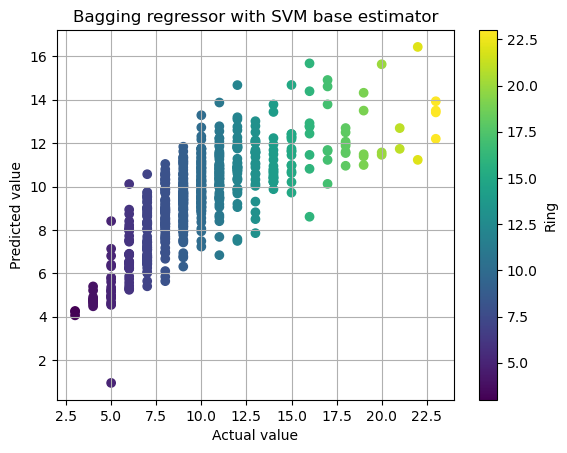

In [101]:
plt.scatter(y_test, y_pred_bagging, c=y_test)
plt.colorbar(label='Ring')
plt.xlabel('Actual value')
plt.ylabel('Predicted value')
plt.title('Bagging regressor with SVM base estimator')
plt.grid()
plt.show()


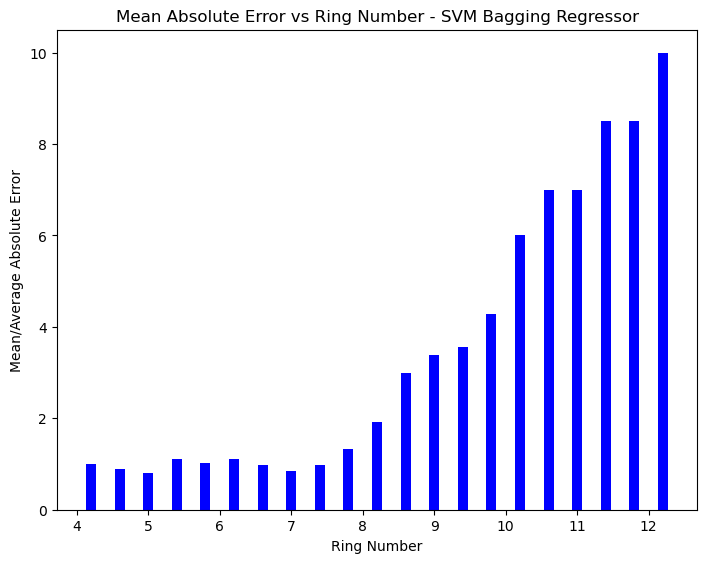

In [102]:
 # Compute prediction errors and group by ring value
errors_rf = np.abs(np.round(y_pred_bagging) - y_test)
df_errors = pd.DataFrame({'Ring': y_test, 'Error': errors_rf})
grouped_errors = df_errors.groupby('Ring').mean()

import numpy as np
import matplotlib.pyplot as plt
 
width = 0.35       # the width of the bars
 
# Plotting
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax.bar(grouped_errors.index, grouped_errors.Error, width, color='b')
 
# Add labels, title, and legend
ax.set_ylabel('Mean/Average Absolute Error')
ax.set_xlabel('Ring Number')
ax.set_title('Mean Absolute Error vs Ring Number - SVM Bagging Regressor')
ax.set_xticklabels(grouped_errors_reduced.index)
plt.show()

Compare the performance of your first Random Forest regressor with the Bagging regressor.

The above bar plot shows that SVM bagging regressor fails to perform well on large ring value as well. The error distribution looks similar to that of the above random forest. This might be the result of imbalanced dataset where we have relatively less number of large ring value in training dataset.  However, the RMSE of SVM bagging regressor is less (2.239) compared to that of random forest (Random Forest with all features - RMSE: 2.437 & Random Forest with reduced features - RMSE: 2.440). This shows SVM bagging regressor model has comparatively less error in predictions than random forests.